# CS631 Final Project

# Prepare the environment

#### Install environment

In [ ]:
!apt-get update -qq > /dev/null
!apt-get install openjdk-8-jdk-headless -qq > /dev/null
!wget -q https://dlcdn.apache.org/spark/spark-3.5.0/spark-3.5.0-bin-hadoop3.tgz
!tar xf spark-3.5.0-bin-hadoop3.tgz
!pip install -q findspark

In [ ]:
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.5.0-bin-hadoop3"

import findspark
findspark.init()

from pyspark.sql import SparkSession

Note that we need to move the below jar file *graphframes-0.8.3-spark3.5-s_2.12.jar* to the folder "/content/spark-3.5.0-bin-hadoop3/jars". (Looks like we do not need it now)

In [ ]:
### graphframes does not support Spark 3.3.3
!wget https://repos.spark-packages.org/graphframes/graphframes/0.8.3-spark3.5-s_2.12/graphframes-0.8.3-spark3.5-s_2.12.jar

--2023-12-13 05:10:44--  https://repos.spark-packages.org/graphframes/graphframes/0.8.3-spark3.5-s_2.12/graphframes-0.8.3-spark3.5-s_2.12.jar
Resolving repos.spark-packages.org (repos.spark-packages.org)... 18.173.166.39, 18.173.166.12, 18.173.166.117, ...
Connecting to repos.spark-packages.org (repos.spark-packages.org)|18.173.166.39|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 247011 (241K) [binary/octet-stream]
Saving to: ‘graphframes-0.8.3-spark3.5-s_2.12.jar’

graphframes-0.8.3-s 100%[===================>] 241.22K  --.-KB/s    in 0.09s   

2023-12-13 05:10:44 (2.51 MB/s) - ‘graphframes-0.8.3-spark3.5-s_2.12.jar’ saved [247011/247011]



In [ ]:
spark = SparkSession.builder.appName("GraphFrames").config("spark.jars.packages", "graphframes:graphframes:0.8.3-spark3.5-s_2.12").getOrCreate()

In [ ]:
!pip install graphframes

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 1.8 MB/s eta 0:00:00


#### Run a sample test example to verify we set up the environment and get familiar with some functionalities

In [ ]:
from graphframes import *

vertices_data = [
    ('100', 'Yang', 'Nuoyan', 18),
    ('101', 'Liu', 'Siyuan', 18),
    ('102', 'Zhang', 'Tingge', 18),
    ('103', 'Zheng', 'Jimmy', 35),
    ('104', 'Ju', 'Alex', 40),
    ('105', 'Zhong', 'Lisa', 22),
    ('106', 'Song', 'Melody', 27),
]

# Create a new DataFrame for vertices
vertices = spark.createDataFrame(vertices_data, ['id', 'lastName', 'firstName', 'age'])

edges = [
    ('100', '101', 'friend'),
    ('101', '100', 'friend'),
    ('102', '100', 'works_with'),
    ('100', '102', 'works_with'),
    ('101', '102', 'classmate'),
    ('102', '103', 'friend'),
    ('103', '102', 'friend'),
    ('104', '102', 'works_with'),
    ('102', '104', 'works_with'),
    ('103', '104', 'classmate'),
    ('105', '106', 'friend'),
    ('106', '105', 'friend'),
    ('106', '100', 'works_with'),
    ('100', '106', 'works_with'),
]

# Create a new DataFrame for edges
edges = spark.createDataFrame(edges, ['src', 'dst', 'relationship'])

g = GraphFrame(vertices, edges)

# Take a look at the DataFrames
g.vertices.show()
g.edges.show()

+---+--------+---------+---+
| id|lastName|firstName|age|
+---+--------+---------+---+
|100|    Yang|   Nuoyan| 18|
|101|     Liu|   Siyuan| 18|
|102|   Zhang|   Tingge| 18|
|103|   Zheng|    Jimmy| 35|
|104|      Ju|     Alex| 40|
|105|   Zhong|     Lisa| 22|
|106|    Song|   Melody| 27|
+---+--------+---------+---+

+---+---+------------+
|src|dst|relationship|
+---+---+------------+
|100|101|      friend|
|101|100|      friend|
|102|100|  works_with|
|100|102|  works_with|
|101|102|   classmate|
|102|103|      friend|
|103|102|      friend|
|104|102|  works_with|
|102|104|  works_with|
|103|104|   classmate|
|105|106|      friend|
|106|105|      friend|
|106|100|  works_with|
|100|106|  works_with|
+---+---+------------+



In [ ]:
# Check the number of edges of each vertex (out-degree)
g.degrees.show()

+---+------+
| id|degree|
+---+------+
|101|     3|
|100|     6|
|102|     7|
|103|     3|
|104|     3|
|106|     4|
|105|     2|
+---+------+



In [ ]:
# Get a DataFrame with columns "id" and "inDegree" (in-degree)
vertexInDegrees = g.inDegrees.show()

+---+--------+
| id|inDegree|
+---+--------+
|101|       1|
|100|       3|
|102|       4|
|103|       1|
|104|       2|
|106|       2|
|105|       1|
+---+--------+



In [ ]:
# Find the youngest user's age in the graph.
# This queries the vertex DataFrame.
g.vertices.groupBy().min("age").show()

+--------+
|min(age)|
+--------+
|      18|
+--------+



# Read the data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


First we need to get familiar with our datasets.

In [ ]:
# Read CSV files into Spark DataFrames
flights_raw = spark.read.csv("/content/drive/MyDrive/CS631Proj/data/flights.csv", header=True, inferSchema=True)
airports_raw = spark.read.csv("/content/drive/MyDrive/CS631Proj/data/airports.csv", header=True, inferSchema=True)
airlines_raw = spark.read.csv("/content/drive/MyDrive/CS631Proj/data/airlines.csv", header=True, inferSchema=True)

# # Show the first few rows of each DataFrame
# flights_raw.show()
# airports_raw.show()
# airlines_raw.show()

### Plot of all the flights

In [ ]:
import pandas as pd
import math

df_flights = pd.read_csv("/content/drive/MyDrive/CS631Proj/data/flights.csv", delimiter=',', skiprows=0, low_memory=False)
df_airport = pd.read_csv("/content/drive/MyDrive/CS631Proj/data/airports.csv", delimiter=',', skiprows=0, low_memory=False)
df_airlines = pd.read_csv("/content/drive/MyDrive/CS631Proj/data/airlines.csv", delimiter=',', skiprows=0, low_memory=False)

sel_df_airport = df_airport[['LATITUDE', 'LONGITUDE']]
sel_df_airport = sel_df_airport.dropna(subset=['LATITUDE', 'LONGITUDE'])
airport_geo = list(zip(sel_df_airport["LATITUDE"], sel_df_airport["LONGITUDE"]))
for i in airport_geo:
  j = i[0]
  k = i[1]
  if math.isnan(float(j)):
    print(i)
  if math.isnan(float(k)):
    print(i)

In [ ]:
airport_info = df_airport[['LATITUDE', 'LONGITUDE', 'IATA_CODE']]
airport_dict = dict(zip(df_airport['IATA_CODE'], airport_geo))

flights_info = df_flights[["ORIGIN_AIRPORT","DESTINATION_AIRPORT"]].drop_duplicates()

In [ ]:
count = 0
origin_des = []
for index, row in flights_info.iterrows():
    try:
      origin = airport_dict[row['ORIGIN_AIRPORT']]
      des = airport_dict[row['DESTINATION_AIRPORT']]
      #print(airport_dict[origin])

      count += 1
    except:
      continue
    origin_des.append([origin, des])
print(f"The number of flights is {count}.")

The number of flights is 4665.


In [ ]:
import folium

show_map = folium.Map(airport_geo[0], zoom_start=15)
for origin, destination in origin_des:
#for origin in airport_geo:
    folium.CircleMarker([origin[0], origin[1]],
                        radius=15,
                        fill_color="#3db7e4", # divvy color
                       ).add_to(show_map)

    folium.CircleMarker([destination[0], destination[1]],
                        radius=15,
                        fill_color="red", # divvy color
                       ).add_to(show_map)

    folium.PolyLine([[origin[0], origin[1]],
                     [destination[0], destination[1]]]).add_to(show_map)
show_map

### Look into the Data Types and Convert Data to Dataframe

In [ ]:
flights_raw.dtypes

[('YEAR', 'int'),
 ('MONTH', 'int'),
 ('DAY', 'int'),
 ('DAY_OF_WEEK', 'int'),
 ('AIRLINE', 'string'),
 ('FLIGHT_NUMBER', 'int'),
 ('TAIL_NUMBER', 'string'),
 ('ORIGIN_AIRPORT', 'string'),
 ('DESTINATION_AIRPORT', 'string'),
 ('SCHEDULED_DEPARTURE', 'int'),
 ('DEPARTURE_TIME', 'int'),
 ('DEPARTURE_DELAY', 'int'),
 ('TAXI_OUT', 'int'),
 ('WHEELS_OFF', 'int'),
 ('SCHEDULED_TIME', 'int'),
 ('ELAPSED_TIME', 'int'),
 ('AIR_TIME', 'int'),
 ('DISTANCE', 'int'),
 ('WHEELS_ON', 'int'),
 ('TAXI_IN', 'int'),
 ('SCHEDULED_ARRIVAL', 'int'),
 ('ARRIVAL_TIME', 'int'),
 ('ARRIVAL_DELAY', 'int'),
 ('DIVERTED', 'int'),
 ('CANCELLED', 'int'),
 ('CANCELLATION_REASON', 'string'),
 ('AIR_SYSTEM_DELAY', 'int'),
 ('SECURITY_DELAY', 'int'),
 ('AIRLINE_DELAY', 'int'),
 ('LATE_AIRCRAFT_DELAY', 'int'),
 ('WEATHER_DELAY', 'int')]

In [ ]:
airports_raw.dtypes

[('IATA_CODE', 'string'),
 ('AIRPORT', 'string'),
 ('CITY', 'string'),
 ('STATE', 'string'),
 ('COUNTRY', 'string'),
 ('LATITUDE', 'double'),
 ('LONGITUDE', 'double')]

In [ ]:
airlines_raw.dtypes

[('IATA_CODE', 'string'), ('AIRLINE', 'string')]

In [ ]:
# Need to convert data to dataframe

flights = flights_raw.toDF("YEAR", "MONTH", "DAY", "DAY_OF_WEEK", "AIRLINE", "FLIGHT_NUMBER", "TAIL_NUMBER", "ORIGIN_AIRPORT",
                            "DESTINATION_AIRPORT", "SCHEDULED_DEPARTURE", "DEPARTURE_TIME", "DEPARTURE_DELAY", "TAXI_OUT", "WHEELS_OFF",
                            "SCHEDULED_TIME", "ELAPSED_TIME", "AIR_TIME", "DISTANCE", "WHEELS_ON", "TAXI_IN", "SCHEDULED_ARRIVAL",
                            "ARRIVAL_TIME", "ARRIVAL_DELAY", "DIVERTED", "CANCELLED", "CANCELLATION_REASON", "AIR_SYSTEM_DELAY",
                            "SECURITY_DELAY", "AIRLINE_DELAY", "LATE_AIRCRAFT_DELAY", "WEATHER_DELAY").cache()
flights.createOrReplaceTempView("flights")

airports = airports_raw.toDF("IATA_CODE", "AIRPORT", "CITY", "STATE", "COUNTRY", "LATITUDE", "LONGITUDE").cache()
airports.createOrReplaceTempView("airports")

airlines = airlines_raw.toDF("IATA_CODE", "AIRLINE").cache()
airlines.createOrReplaceTempView("airlines")

In [ ]:
flights.show()
airports.show()

+----+-----+---+-----------+-------+-------------+-----------+--------------+-------------------+-------------------+--------------+---------------+--------+----------+--------------+------------+--------+--------+---------+-------+-----------------+------------+-------------+--------+---------+-------------------+----------------+--------------+-------------+-------------------+-------------+
|YEAR|MONTH|DAY|DAY_OF_WEEK|AIRLINE|FLIGHT_NUMBER|TAIL_NUMBER|ORIGIN_AIRPORT|DESTINATION_AIRPORT|SCHEDULED_DEPARTURE|DEPARTURE_TIME|DEPARTURE_DELAY|TAXI_OUT|WHEELS_OFF|SCHEDULED_TIME|ELAPSED_TIME|AIR_TIME|DISTANCE|WHEELS_ON|TAXI_IN|SCHEDULED_ARRIVAL|ARRIVAL_TIME|ARRIVAL_DELAY|DIVERTED|CANCELLED|CANCELLATION_REASON|AIR_SYSTEM_DELAY|SECURITY_DELAY|AIRLINE_DELAY|LATE_AIRCRAFT_DELAY|WEATHER_DELAY|
+----+-----+---+-----------+-------+-------------+-----------+--------------+-------------------+-------------------+--------------+---------------+--------+----------+--------------+------------+--------+-

### Data Visidualization for Airlines

In [ ]:
print(f"For the flights dataset, the number of rows and columns is ({flights.count()}, {len(flights.columns)}).")
print(f"For the airports dataset, the number of rows and columns is ({airports.count()}, {len(airports.columns)}).")
print(f"For the airlines dataset, the number of rows and columns is ({airlines.count()}, {len(airlines.columns)}).")

For the flights dataset, the number of rows and columns is (5819079, 31).
For the airports dataset, the number of rows and columns is (322, 7).
For the airlines dataset, the number of rows and columns is (14, 2).


Given that we intend to investigate the patterns of flight delays, it would be prudent to initially examine their distribution.

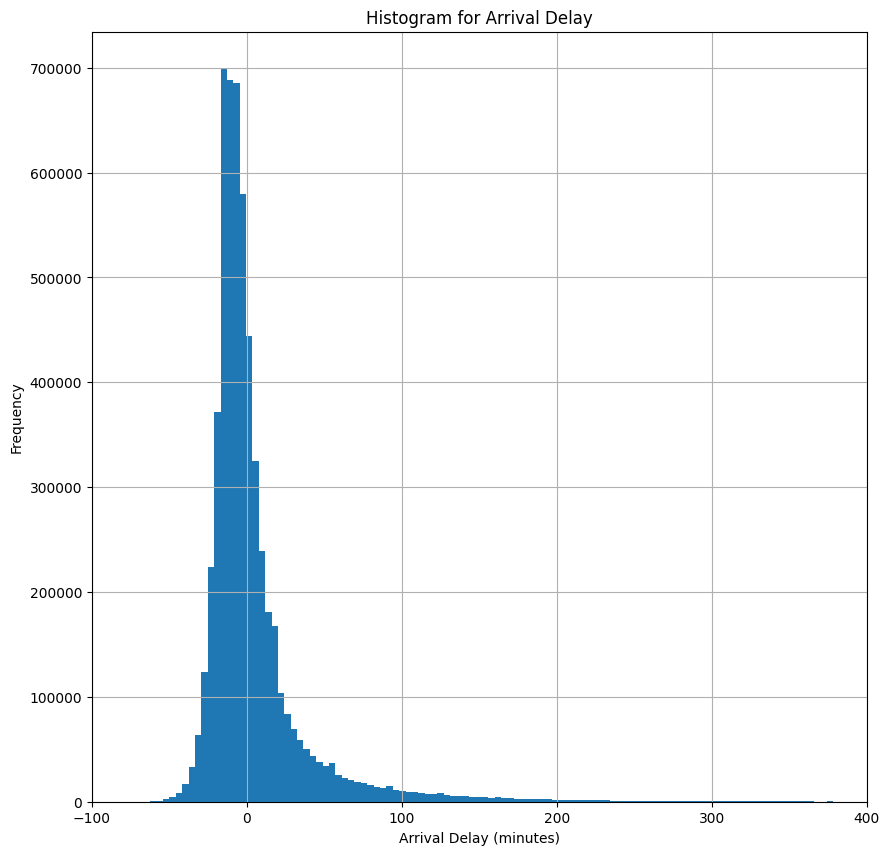

In [ ]:
import matplotlib.pyplot as plt

ax = df_flights.ARRIVAL_DELAY.hist(bins = 500, figsize = (10, 10))
ax.set_xlim(-100, 400)
plt.title("Histogram for Arrival Delay")
plt.xlabel("Arrival Delay (minutes)")
plt.ylabel("Frequency")
plt.show()

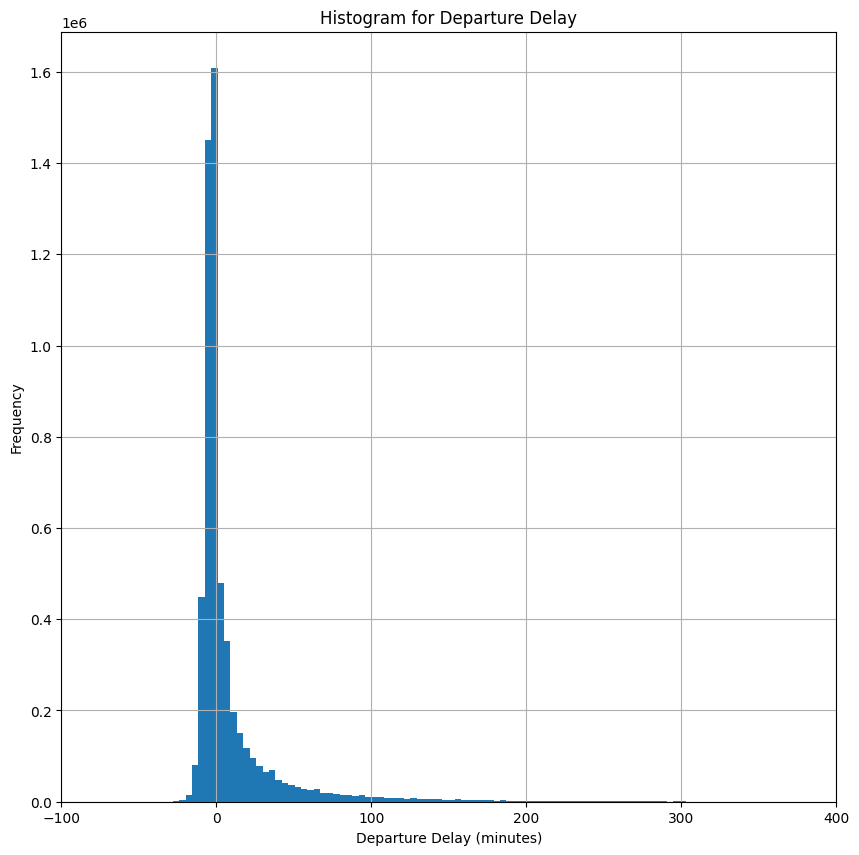

In [ ]:
ax = df_flights.DEPARTURE_DELAY.hist(bins = 500, figsize = (10, 10))
ax.set_xlim(-100, 400)
plt.title("Histogram for Departure Delay")
plt.xlabel("Departure Delay (minutes)")
plt.ylabel("Frequency")
plt.show()

There are in total 14 airlines and we figure out the percentage of air traffic flown by each airline in 2015.

+---------+--------------------+
|IATA_CODE|             AIRLINE|
+---------+--------------------+
|       UA|United Air Lines ...|
|       AA|American Airlines...|
|       US|     US Airways Inc.|
|       F9|Frontier Airlines...|
|       B6|     JetBlue Airways|
|       OO|Skywest Airlines ...|
|       AS|Alaska Airlines Inc.|
|       NK|    Spirit Air Lines|
|       WN|Southwest Airline...|
|       DL|Delta Air Lines Inc.|
|       EV|Atlantic Southeas...|
|       HA|Hawaiian Airlines...|
|       MQ|American Eagle Ai...|
|       VX|      Virgin America|
+---------+--------------------+



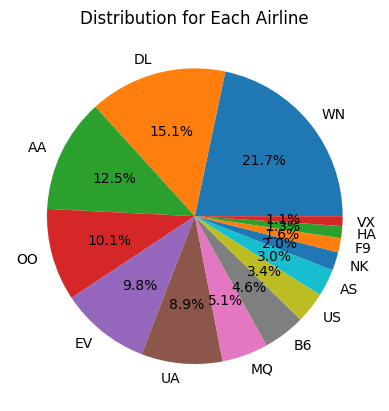

In [ ]:
from pyspark.sql.functions import desc

import matplotlib.pyplot as plt
import numpy as np

airlines.show()

airlines_count = flights.groupBy("AIRLINE").count().orderBy(desc("count")).collect()

y = np.zeros((len(airlines_count)))

airline_name = []
airline_percent = []
total = 0
for i in range(len(airlines_count)):
  r = airlines_count[i]
  y[i] = r["count"]
  airline_name.append(r["AIRLINE"])
  total += r["count"]

y = y / total

plt.pie(y, labels = airline_name, autopct='%1.1f%%')
plt.title("Distribution for Each Airline")
plt.show()

We select the data we want to use.

In [ ]:
# Year are all in 2015.
flights_selected = flights.select("MONTH", "DAY", "AIRLINE", "FLIGHT_NUMBER", "ORIGIN_AIRPORT",
                                  "DESTINATION_AIRPORT", "SCHEDULED_DEPARTURE", "DEPARTURE_DELAY",
                                  "DISTANCE", "SCHEDULED_ARRIVAL", "ARRIVAL_TIME", "ARRIVAL_DELAY",
                                  "DIVERTED", "CANCELLED")

In [ ]:
# Print the number of records with cancellations
num_cancel = flights_selected.filter("CANCELLED == 1").count()
print(f"The number of cancelled flights is {num_cancel}.")

The number of cancelled flights is 89884.


Cancellation labels distrubution:
+---------+-------+
|CANCELLED|  count|
+---------+-------+
|        1|  89884|
|        0|5729195|
+---------+-------+



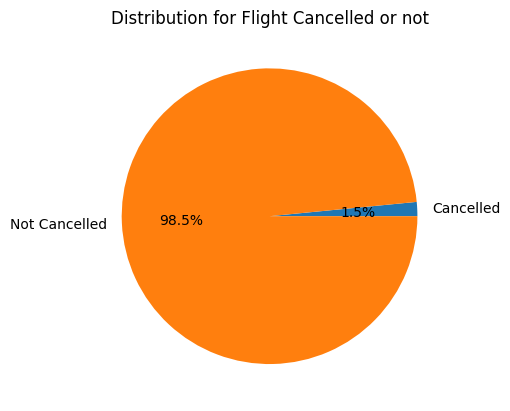

In [ ]:
# Determine the counts of the target value
print('Cancellation labels distrubution:')
flights_selected.groupBy('CANCELLED').count().show()

cancel_info = flights_selected.groupBy('CANCELLED').count().collect()
cancel = []
for i in cancel_info:
    cancel.append(i["count"])

plt.pie(cancel, labels = ["Cancelled", "Not Cancelled"], autopct='%1.1f%%')
plt.title("Distribution for Flight Cancelled or not")
plt.show()

# Construct a flight network graph

In [ ]:
from pyspark.sql.functions import monotonically_increasing_id
from pyspark.sql.types import IntegerType

# Add a new column "numeric_code" with numeric IDs for each airport code
airport_ori_ID = airports.select("IATA_CODE").withColumn("ORIGIN_AIRPORT_ID", monotonically_increasing_id().cast(IntegerType()))
airport_des_ID = airports.select("IATA_CODE").withColumn("DES_AIRPORT_ID", monotonically_increasing_id().cast(IntegerType()))

# Show the resulting DataFrame
airport_ori_ID.show()
airport_ori_ID.createOrReplaceTempView("airport_ori_ID")
airport_des_ID.show()
airport_des_ID.createOrReplaceTempView("airport_des_ID")

flights_withID = spark.sql(f"""SELECT * FROM flights f JOIN airport_ori_ID a ON f.ORIGIN_AIRPORT = a.IATA_CODE
                            JOIN airport_des_ID ad ON f.DESTINATION_AIRPORT = ad.IATA_CODE""")
flights_withID = flights_withID.drop("IATA_CODE")
# flights_withID.show()
flights_withID.createOrReplaceTempView("flights_withID")

+---------+-----------------+
|IATA_CODE|ORIGIN_AIRPORT_ID|
+---------+-----------------+
|      ABE|                0|
|      ABI|                1|
|      ABQ|                2|
|      ABR|                3|
|      ABY|                4|
|      ACK|                5|
|      ACT|                6|
|      ACV|                7|
|      ACY|                8|
|      ADK|                9|
|      ADQ|               10|
|      AEX|               11|
|      AGS|               12|
|      AKN|               13|
|      ALB|               14|
|      ALO|               15|
|      AMA|               16|
|      ANC|               17|
|      APN|               18|
|      ASE|               19|
+---------+-----------------+
only showing top 20 rows

+---------+--------------+
|IATA_CODE|DES_AIRPORT_ID|
+---------+--------------+
|      ABE|             0|
|      ABI|             1|
|      ABQ|             2|
|      ABR|             3|
|      ABY|             4|
|      ACK|             5|
|      ACT|

In [ ]:
from graphframes import *

# Vertex: airport information
v = airport_ori_ID.select("ORIGIN_AIRPORT_ID")

# Rename columns to include 'id' as the vertex identifier
v = v.withColumnRenamed("ORIGIN_AIRPORT_ID", "id")

# Edge: original id, destination id, flight distance
e = flights_withID.select("ORIGIN_AIRPORT_ID", "DES_AIRPORT_ID", "DISTANCE")

# Rename columns to match GraphFrame requirements
e = e.withColumnRenamed("ORIGIN_AIRPORT_ID", "src").withColumnRenamed("DES_AIRPORT_ID", "dst")

graph = GraphFrame(v, e)

# Show the results
graph.vertices.show()
graph.edges.show()

# Vertex: airport information
v = airport_ori_ID.select("ORIGIN_AIRPORT_ID")

# Rename columns to include 'id' as the vertex identifier
v = v.withColumnRenamed("ORIGIN_AIRPORT_ID", "id")

# Edge: original id, destination id, flight distance
e_distinct = flights_withID.select("ORIGIN_AIRPORT_ID", "DES_AIRPORT_ID", "DISTANCE").distinct()

# Rename columns to match GraphFrame requirements
e_distinct = e_distinct.withColumnRenamed("ORIGIN_AIRPORT_ID", "src").withColumnRenamed("DES_AIRPORT_ID", "dst")

graph_distinct = GraphFrame(v, e_distinct)

# # Show the results
graph_distinct.vertices.show()
graph_distinct.edges.show()

+---+
| id|
+---+
|  0|
|  1|
|  2|
|  3|
|  4|
|  5|
|  6|
|  7|
|  8|
|  9|
| 10|
| 11|
| 12|
| 13|
| 14|
| 15|
| 16|
| 17|
| 18|
| 19|
+---+
only showing top 20 rows

+---+---+--------+
|src|dst|DISTANCE|
+---+---+--------+
| 17|277|    1448|
|176|235|    2330|
|278| 66|    2296|
|176|203|    2342|
|277| 17|    1448|
|278|216|    1589|
|174|216|    1299|
|176| 66|    2125|
|278| 86|    1464|
|174| 20|    1747|
| 85| 20|    1199|
|174|203|    2174|
|176|216|    1535|
|286| 20|    1590|
|277|216|    1399|
| 17|277|    1448|
| 17|277|    1448|
|278|151|    1635|
| 17|236|    1542|
|236|216|    1426|
+---+---+--------+
only showing top 20 rows

+---+
| id|
+---+
|  0|
|  1|
|  2|
|  3|
|  4|
|  5|
|  6|
|  7|
|  8|
|  9|
| 10|
| 11|
| 12|
| 13|
| 14|
| 15|
| 16|
| 17|
| 18|
| 19|
+---+
only showing top 20 rows

+---+---+--------+
|src|dst|DISTANCE|
+---+---+--------+
|193|239|    1849|
|284| 86|     229|
|210| 20|     302|
| 51|193|     787|
|239| 81|     879|
|216|195|     349|
|217|15

# Use cases of Spark GraphFrames

#### Find the number of airports and flights

In [ ]:
# The # of airports = # of vertices
num_airports = graph.vertices.count()
print(f"The number of airports is {num_airports}.")
# The # of flights = # of edges
num_flights = graph.edges.count()
print(f"The number of flights is {num_flights}.")

The number of airports is 322.
The number of flights is 5332914.


In [ ]:
# Use for verify the # of airports
verify_airports = flights_withID.select("ORIGIN_AIRPORT_ID").union(flights_withID.select("DES_AIRPORT_ID")).distinct().count()
print(f"The number of airports is {verify_airports}.")

The number of airports is 322.


#### Find the route/flight with the longest/shortest distance

In [ ]:
from pyspark.sql.functions import desc
graph.edges.orderBy(desc("DISTANCE")).take(10)

[Row(src=166, dst=141, DISTANCE=4983),
 Row(src=166, dst=141, DISTANCE=4983),
 Row(src=166, dst=141, DISTANCE=4983),
 Row(src=141, dst=166, DISTANCE=4983),
 Row(src=141, dst=166, DISTANCE=4983),
 Row(src=141, dst=166, DISTANCE=4983),
 Row(src=141, dst=166, DISTANCE=4983),
 Row(src=141, dst=166, DISTANCE=4983),
 Row(src=141, dst=166, DISTANCE=4983),
 Row(src=166, dst=141, DISTANCE=4983)]

In [ ]:
top_ten_distance = graph.edges.orderBy(desc("DISTANCE")).take(10)
first_src = top_ten_distance[0]["src"]
first_des = top_ten_distance[0]["dst"]

In [ ]:
longest_route = spark.sql(f"""SELECT AIRLINE, FLIGHT_NUMBER, ORIGIN_AIRPORT,
                              DESTINATION_AIRPORT, DISTANCE FROM flights_withID WHERE
                              (ORIGIN_AIRPORT_ID = {first_src} AND DES_AIRPORT_ID = {first_des})
                              OR (ORIGIN_AIRPORT_ID = {first_des} AND DES_AIRPORT_ID = {first_src})""")
longest_route.show()

+-------+-------------+--------------+-------------------+--------+
|AIRLINE|FLIGHT_NUMBER|ORIGIN_AIRPORT|DESTINATION_AIRPORT|DISTANCE|
+-------+-------------+--------------+-------------------+--------+
|     DL|          420|           JFK|                HNL|    4983|
|     HA|           51|           JFK|                HNL|    4983|
|     HA|           50|           HNL|                JFK|    4983|
|     DL|         1059|           HNL|                JFK|    4983|
|     DL|          420|           JFK|                HNL|    4983|
|     HA|           51|           JFK|                HNL|    4983|
|     HA|           50|           HNL|                JFK|    4983|
|     DL|         1059|           HNL|                JFK|    4983|
|     DL|          420|           JFK|                HNL|    4983|
|     HA|           51|           JFK|                HNL|    4983|
|     HA|           50|           HNL|                JFK|    4983|
|     DL|         1059|           HNL|          

In [ ]:
from pyspark.sql.functions import asc

bottom_ten_distance = graph.edges.orderBy(asc("DISTANCE")).take(10)
bottom_src = bottom_ten_distance[0]["src"]
bottom_des = bottom_ten_distance[0]["dst"]

In [ ]:
shortest_route = spark.sql(f"""SELECT AIRLINE, FLIGHT_NUMBER, ORIGIN_AIRPORT,
                              DESTINATION_AIRPORT, DISTANCE FROM flights_withID WHERE
                              (ORIGIN_AIRPORT_ID = {bottom_src} AND DES_AIRPORT_ID = {bottom_des})""")
shortest_route.show()

+-------+-------------+--------------+-------------------+--------+
|AIRLINE|FLIGHT_NUMBER|ORIGIN_AIRPORT|DESTINATION_AIRPORT|DISTANCE|
+-------+-------------+--------------+-------------------+--------+
|     AA|         1297|           EWR|                JFK|      21|
+-------+-------------+--------------+-------------------+--------+



#### Find the busiest airport (the one has most in-degree edges)

In [ ]:
from pyspark.sql.functions import desc

indegrees = graph.inDegrees
indegrees.orderBy(desc("inDegree")).take(10)

[Row(id=20, inDegree=346904),
 Row(id=228, inDegree=285906),
 Row(id=86, inDegree=239582),
 Row(id=85, inDegree=196010),
 Row(id=176, inDegree=194696),
 Row(id=278, inDegree=147966),
 Row(id=239, inDegree=146812),
 Row(id=151, inDegree=146683),
 Row(id=174, inDegree=133198),
 Row(id=216, inDegree=112128)]

In [ ]:
top_ten_in_degress = indegrees.orderBy(desc("inDegree")).take(10)
top_code = top_ten_in_degress[0]["id"]
print(top_code)

20


In [ ]:
busiest_airport = spark.sql(f"SELECT * FROM airport_ori_ID WHERE ORIGIN_AIRPORT_ID = {top_code}")
busiest_airport.show()

+---------+-----------------+
|IATA_CODE|ORIGIN_AIRPORT_ID|
+---------+-----------------+
|      ATL|               20|
+---------+-----------------+



In [ ]:
most_busiest_airport = busiest_airport.take(10)[0]["IATA_CODE"]

In [ ]:
airport_info_most_busiest = spark.sql(f"SELECT * FROM airports WHERE IATA_CODE = '{most_busiest_airport}'")
airport_info_most_busiest.show()

+---------+--------------------+-------+-----+-------+--------+---------+
|IATA_CODE|             AIRPORT|   CITY|STATE|COUNTRY|LATITUDE|LONGITUDE|
+---------+--------------------+-------+-----+-------+--------+---------+
|      ATL|Hartsfield-Jackso...|Atlanta|   GA|    USA|33.64044|-84.42694|
+---------+--------------------+-------+-----+-------+--------+---------+



In [ ]:
airport_info = airports.select("IATA_CODE", "LATITUDE", "LONGITUDE").withColumn("AIRPORT_ID", monotonically_increasing_id().cast(IntegerType()))
airport_info.show()
airport_info.createOrReplaceTempView("airport_info")

def find_in_neighbors(top_code):
    #graph_distinct.filterEdges(f"src={top_code}").edges.collect()
    in_df = graph_distinct.filterEdges(f"dst={top_code}").edges.collect()
    in_neighbors = []
    for i in in_df:
      in_neighbors.append([i["src"], i["dst"]])

    return in_neighbors

def find_airport(neighbors):
    flights_geo = []
    for src, des in neighbors:
        src_info = spark.sql(f"""SELECT LATITUDE,
                              LONGITUDE, IATA_CODE FROM airport_info WHERE
                              AIRPORT_ID = {src}""").take(1)
        des_info = spark.sql(f"""SELECT LATITUDE,
                              LONGITUDE, IATA_CODE FROM airport_info WHERE
                              AIRPORT_ID = {des}""").take(1)
        flights_geo.append([[src_info[0]["LATITUDE"], src_info[0]["LONGITUDE"], src_info[0]["IATA_CODE"]], [des_info[0]["LATITUDE"], des_info[0]["LONGITUDE"], des_info[0]["IATA_CODE"]]])
    return flights_geo

def find_out_neighbors(top_code):
    #graph_distinct.filterEdges(f"src={top_code}").edges.collect()
    in_df = graph_distinct.filterEdges(f"src={top_code}").edges.collect()
    in_neighbors = []
    for i in in_df:
      in_neighbors.append([i["src"], i["dst"]])

    return in_neighbors

+---------+--------+----------+----------+
|IATA_CODE|LATITUDE| LONGITUDE|AIRPORT_ID|
+---------+--------+----------+----------+
|      ABE|40.65236|  -75.4404|         0|
|      ABI|32.41132|  -99.6819|         1|
|      ABQ|35.04022|-106.60919|         2|
|      ABR|45.44906| -98.42183|         3|
|      ABY|31.53552| -84.19447|         4|
|      ACK|41.25305| -70.06018|         5|
|      ACT|31.61129| -97.23052|         6|
|      ACV|40.97812|-124.10862|         7|
|      ACY|39.45758| -74.57717|         8|
|      ADK|51.87796|-176.64603|         9|
|      ADQ|57.74997|-152.49386|        10|
|      AEX|31.32737| -92.54856|        11|
|      AGS|33.36996|  -81.9645|        12|
|      AKN| 58.6768|-156.64922|        13|
|      ALB|42.74812| -73.80298|        14|
|      ALO|42.55708| -92.40034|        15|
|      AMA|35.21937|-101.70593|        16|
|      ANC|61.17432|-149.99619|        17|
|      APN|45.07807| -83.56029|        18|
|      ASE|39.22316|-106.86885|        19|
+---------+

In [ ]:
import folium

neighbors = find_in_neighbors(top_code)
origin_des = find_airport(neighbors)

show_map = folium.Map(airport_geo[0], zoom_start=15)
for origin, destination in origin_des:
#for origin in airport_geo:
    if None in origin:
        continue
    if None in destination:
        continue
    folium.CircleMarker([origin[0], origin[1]],
                        radius=15,
                        fill_color="#3db7e4", popup=origin[2],
                        tooltip='Click for Airport Code',
                       ).add_to(show_map)

    folium.CircleMarker([destination[0], destination[1]],
                        radius=15,
                        fill_color="red", popup=destination[2],
                        tooltip='Click for Airport Code',
                       ).add_to(show_map)

    folium.PolyLine([[origin[0], origin[1]],
                     [destination[0], destination[1]]]).add_to(show_map)
show_map

#### Find the most important route (PageRank)

In [ ]:
from pyspark.sql.functions import desc

page_rank = graph.pageRank(resetProbability=0.05, maxIter=10)

In [ ]:
top_5_most_important = page_rank.vertices.orderBy(desc("pagerank")).take(5)
print(page_rank.edges.orderBy(desc("weight")).take(5))
top_1_most_important = top_5_most_important[0]["id"]

[Row(src=161, dst=93, DISTANCE=353, weight=0.029411764705882353), Row(src=161, dst=93, DISTANCE=353, weight=0.029411764705882353), Row(src=161, dst=93, DISTANCE=353, weight=0.029411764705882353), Row(src=161, dst=93, DISTANCE=353, weight=0.029411764705882353), Row(src=161, dst=93, DISTANCE=353, weight=0.029411764705882353)]


In [ ]:
most_important_airport = spark.sql(f"SELECT * FROM airport_ori_ID WHERE ORIGIN_AIRPORT_ID = '{top_1_most_important}'")
most_important_airport.show()

+---------+-----------------+
|IATA_CODE|ORIGIN_AIRPORT_ID|
+---------+-----------------+
|      ATL|               20|
+---------+-----------------+



In [ ]:
target_airport_info = spark.sql(f"SELECT * FROM airports WHERE IATA_CODE = '{most_busiest_airport}'")
target_airport_info.show()

+---------+--------------------+-------+-----+-------+--------+---------+
|IATA_CODE|             AIRPORT|   CITY|STATE|COUNTRY|LATITUDE|LONGITUDE|
+---------+--------------------+-------+-----+-------+--------+---------+
|      ATL|Hartsfield-Jackso...|Atlanta|   GA|    USA|33.64044|-84.42694|
+---------+--------------------+-------+-----+-------+--------+---------+



In [ ]:
in_neighbors = find_in_neighbors(top_1_most_important)
out_neighbors = find_out_neighbors(top_1_most_important)
neighbors = in_neighbors + out_neighbors
origin_des = find_airport(neighbors)

show_map = folium.Map(airport_geo[0], zoom_start=15)
for origin, destination in origin_des:
#for origin in airport_geo:
    if None in origin:
        continue
    if None in destination:
        continue
    folium.CircleMarker([origin[0], origin[1]],
                        radius=15,
                        fill_color="#3db7e4", popup=origin[2],
                        tooltip='Click for Airport Code',
                       ).add_to(show_map)

    folium.CircleMarker([destination[0], destination[1]],
                        radius=15,
                        fill_color="red", popup=destination[2],
                        tooltip='Click for Airport Code',
                       ).add_to(show_map)

    folium.PolyLine([[origin[0], origin[1]],
                     [destination[0], destination[1]]]).add_to(show_map)
show_map

In [ ]:
# Run PageRank personalized for vertex [20, 228, 176] in parallel
personalized_page_rank = graph.parallelPersonalizedPageRank(resetProbability=0.5, sourceIds=[20, 228, 176], maxIter=10)
print(personalized_page_rank.vertices.orderBy(desc("pageranks")).take(5))
print(personalized_page_rank.edges.orderBy(desc("weight")).take(5))

[Row(id=20, pageranks=SparseVector(3, {0: 0.5355, 1: 0.0257, 2: 0.0183})), Row(id=228, pageranks=SparseVector(3, {0: 0.0212, 1: 0.5297, 2: 0.0207})), Row(id=86, pageranks=SparseVector(3, {0: 0.0186, 1: 0.0192, 2: 0.0182})), Row(id=182, pageranks=SparseVector(3, {0: 0.0117, 1: 0.0134, 2: 0.0034})), Row(id=193, pageranks=SparseVector(3, {0: 0.0115, 1: 0.0093, 2: 0.0074}))]
[Row(src=161, dst=93, DISTANCE=353, weight=0.029411764705882353), Row(src=161, dst=93, DISTANCE=353, weight=0.029411764705882353), Row(src=161, dst=93, DISTANCE=353, weight=0.029411764705882353), Row(src=161, dst=93, DISTANCE=353, weight=0.029411764705882353), Row(src=161, dst=93, DISTANCE=353, weight=0.029411764705882353)]


#### Find a route that requires a minimum number of transitions given source and destination (BFS)

In [ ]:
# from graphframes import *

# # Vertex: airport information
# v = airport_ori_ID.select("ORIGIN_AIRPORT_ID")

# # Rename columns to include 'id' as the vertex identifier
# v = v.withColumnRenamed("ORIGIN_AIRPORT_ID", "id")

# # Edge: original id, destination id, flight distance
# e_distinct = flights_withID.select("ORIGIN_AIRPORT_ID", "DES_AIRPORT_ID", "DISTANCE").distinct()

# # Rename columns to match GraphFrame requirements
# e_distinct = e_distinct.withColumnRenamed("ORIGIN_AIRPORT_ID", "src").withColumnRenamed("DES_AIRPORT_ID", "dst")

# graph_distinct = GraphFrame(v, e_distinct)

# # Show the results
graph_distinct.vertices.show()
graph_distinct.edges.show()

def find_shortestpath(src, des):
    return graph_distinct.bfs(fromExpr=f"id={src}", toExpr=f"id={des}", maxPathLength=5)

df_bfs = find_shortestpath(20, 30).take(5)

+---+
| id|
+---+
|  0|
|  1|
|  2|
|  3|
|  4|
|  5|
|  6|
|  7|
|  8|
|  9|
| 10|
| 11|
| 12|
| 13|
| 14|
| 15|
| 16|
| 17|
| 18|
| 19|
+---+
only showing top 20 rows

+---+---+--------+
|src|dst|DISTANCE|
+---+---+--------+
|193|239|    1849|
|284| 86|     229|
|210| 20|     302|
| 51|193|     787|
|239| 81|     879|
|216|195|     349|
|217|151|     305|
|213|176|     266|
|  8|193|     852|
|277|141|    2677|
|149|131|     239|
| 78|228|     265|
| 66| 84|     331|
| 50|286|     574|
| 81|  2|     580|
|269| 81|     248|
|228| 33|     716|
| 85|199|     964|
| 66|266|     600|
|236| 20|    2172|
+---+---+--------+
only showing top 20 rows



In [ ]:
neighbors = []
path = df_bfs[0]
old_id = path["from"]["id"]
for i in range(5):
  s = f"v{i+1}"
  try:
    new_id = path[s]["id"]
  except:
    new_id = path["to"]["id"]
    neighbors.append([old_id, new_id])
    break
  neighbors.append([old_id, new_id])
  old_id = new_id

origin_des = find_airport(neighbors)
show_map = folium.Map(airport_geo[0], zoom_start=15)
for origin, destination in origin_des:
#for origin in airport_geo:
    if None in origin:
        continue
    if None in destination:
        continue
    folium.CircleMarker([origin[0], origin[1]],
                        radius=15,
                        fill_color="#3db7e4", popup=origin[2],
                        tooltip='Click for Airport Code',
                       ).add_to(show_map)

    folium.CircleMarker([destination[0], destination[1]],
                        radius=15,
                        fill_color="red", popup=destination[2],
                        tooltip='Click for Airport Code',
                       ).add_to(show_map)

    folium.PolyLine([[origin[0], origin[1]],
                     [destination[0], destination[1]]]).add_to(show_map)
show_map

#### Find the connected component for the airport

In [ ]:
spark.sparkContext.setCheckpointDir('./checkpoints')
component = graph_distinct.connectedComponents(algorithm='graphframes', checkpointInterval=2, broadcastThreshold=1000000)
component.show()

+---+---------+
| id|component|
+---+---------+
|  0|        0|
|  1|        0|
|  2|        0|
|  3|        0|
|  4|        0|
|  5|        0|
|  6|        0|
|  7|        0|
|  8|        0|
|  9|        0|
| 10|        0|
| 11|        0|
| 12|        0|
| 13|        0|
| 14|        0|
| 15|        0|
| 16|        0|
| 17|        0|
| 18|        0|
| 19|        0|
+---+---------+
only showing top 20 rows



# Apply machine learning models to predict delays

#### Data cleaning

In [ ]:
# Print the number of records with missing 'delay' values
num_no_delay = flights_selected.filter("ARRIVAL_DELAY IS NULL").count()
print(f"The number of records that missing delay values is {num_no_delay}.")

The number of records that missing delay values is 105071.


In [ ]:
# Remove records with missing 'delay' values
flights_delayed = flights_selected.filter("ARRIVAL_DELAY IS NOT NULL")

# Count the remaining rows
print(f"""The original flights count is {flights.count()} and after removing the missing delay values is {flights_delayed.count()}.""")

The original flights count is 5819079 and after removing the missing delay values is 5714008.


#### Create delay label

How to define "delay"? A flight delay occurs when an airline flight takes off and/or lands later than its scheduled time. The United States Federal Aviation Administration (FAA) considers a flight to be delayed when it is 15 minutes later than its scheduled time.

Then our label 0: no delay and 1: delay

In [ ]:
from pyspark.sql.types import *

# Add a new column "delay"
flights_delayed_label = flights_delayed.withColumn("LABEL", (flights_selected.ARRIVAL_DELAY >= 15).cast(IntegerType()))
flights_delayed_label.show()

+-----+---+-------+-------------+--------------+-------------------+-------------------+---------------+--------+-----------------+------------+-------------+--------+---------+-----+
|MONTH|DAY|AIRLINE|FLIGHT_NUMBER|ORIGIN_AIRPORT|DESTINATION_AIRPORT|SCHEDULED_DEPARTURE|DEPARTURE_DELAY|DISTANCE|SCHEDULED_ARRIVAL|ARRIVAL_TIME|ARRIVAL_DELAY|DIVERTED|CANCELLED|LABEL|
+-----+---+-------+-------------+--------------+-------------------+-------------------+---------------+--------+-----------------+------------+-------------+--------+---------+-----+
|    1|  1|     AS|           98|           ANC|                SEA|                  5|            -11|    1448|              430|         408|          -22|       0|        0|    0|
|    1|  1|     AA|         2336|           LAX|                PBI|                 10|             -8|    2330|              750|         741|           -9|       0|        0|    0|
|    1|  1|     US|          840|           SFO|                CLT|            

In [ ]:
from pyspark.sql.functions import expr
delay_each_airline = flights_delayed_label.groupBy('AIRLINE', 'LABEL').count().join(flights_delayed_label.groupBy("AIRLINE").count().withColumnRenamed("count", "total_count"), 'AIRLINE').filter("LABEL = 1")
delay_percent_each_airline = delay_each_airline.withColumn("percentage", delay_each_airline["count"] / delay_each_airline["total_count"])
delay_percent_each_airline.show()

+-------+-----+------+-----------+-------------------+
|AIRLINE|LABEL| count|total_count|         percentage|
+-------+-----+------+-----------+-------------------+
|     UA|    1|104722|     507762| 0.2062422946183448|
|     NK|    1| 34221|     115193| 0.2970753431198076|
|     AA|    1|130279|     712935|0.18273615406734134|
|     EV|    1|109184|     554752| 0.1968158744808491|
|     B6|    1| 59175|     262042|0.22582257806000564|
|     DL|    1|118023|     870275|0.13561575364109046|
|     OO|    1|107795|     576814|0.18687999944522846|
|     F9|    1| 23570|      90090|0.26162726162726163|
|     US|    1| 36549|     194223|0.18818059653079192|
|     MQ|    1| 60547|     278791|0.21717702508330614|
|     HA|    1|  8618|      76041|0.11333359634933786|
|     AS|    1| 22352|     171439|0.13037873529360297|
|     VX|    1| 11778|      61248| 0.1923001567398119|
|     WN|    1|236626|    1242403| 0.1904583295436344|
+-------+-----+------+-----------+-------------------+



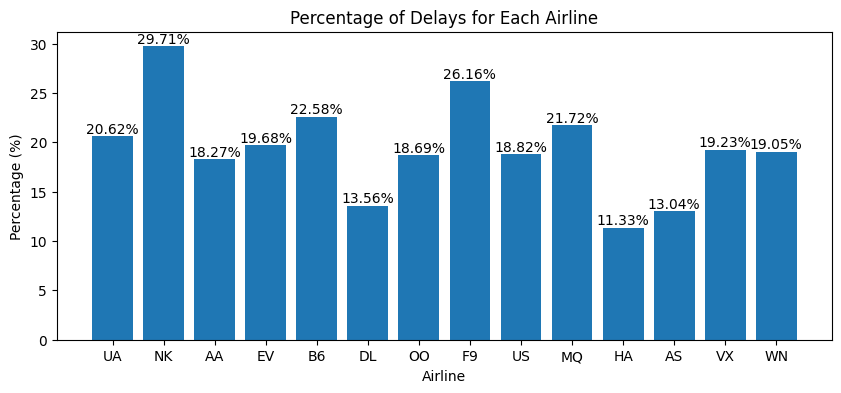

In [ ]:
import matplotlib.pyplot as plt
delay_percent_pd = delay_percent_each_airline.toPandas()

# Plot a bar graph
fig, ax = plt.subplots(figsize=(10, 4))
bars = ax.bar(delay_percent_pd["AIRLINE"], round(delay_percent_pd["percentage"] * 100, 2))

# Add number labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{round(yval, 2)}%", ha='center', va='bottom')

plt.title("Percentage of Delays for Each Airline")
plt.xlabel("Airline")
plt.ylabel("Percentage (%)")
plt.show()

In [ ]:
# Determine the counts of the target value
print('Labels distrubution:')
flights_delayed_label.groupBy('label').count().show()

Labels distrubution:
+-----+-------+
|label|  count|
+-----+-------+
|    1|1063439|
|    0|4650569|
+-----+-------+



In [ ]:
# Dealing with imbalance data
major_class_flights = flights_delayed_label.filter(flights_delayed_label.LABEL == 0)
minor_class_flights = flights_delayed_label.filter(flights_delayed_label.LABEL == 1)
ratio = minor_class_flights.count() / major_class_flights.count()
balanced_flights_delayed  = major_class_flights.sample(withReplacement=True, fraction=ratio, seed=631).unionAll(minor_class_flights)

# Determine the counts of the target value
print('Delay label distrubution:')
balanced_flights_delayed.groupBy('label').count().show()

Delay label distrubution:
+-----+-------+
|label|  count|
+-----+-------+
|    0|1063623|
|    1|1063439|
+-----+-------+



In [ ]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler, StandardScaler, MinMaxScaler
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import BinaryClassificationEvaluator

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, auc
from pyspark.ml.stat import Correlation

#### Logstic Regression

##### Data Processing & Model Training

In [ ]:
# Apply One-hot Encoding to string columns
airline_indexer = StringIndexer(inputCol="AIRLINE", outputCol="AIRLINEIndex")
airline_encoder = OneHotEncoder(inputCol="AIRLINEIndex", outputCol="AIRLINEVec")

origin_indexer = StringIndexer(inputCol="ORIGIN_AIRPORT", outputCol="ORIGIN_AIRPORTIndex")
origin_encoder = OneHotEncoder(inputCol="ORIGIN_AIRPORTIndex", outputCol="ORIGIN_AIRPORTVec")

destination_indexer = StringIndexer(inputCol="DESTINATION_AIRPORT", outputCol="DESTINATION_AIRPORTIndex")
destination_encoder = OneHotEncoder(inputCol="DESTINATION_AIRPORTIndex", outputCol="DESTINATION_AIRPORTVec")

assembler = VectorAssembler(inputCols = ["MONTH", "DAY", "AIRLINEVec", "FLIGHT_NUMBER", "ORIGIN_AIRPORTVec",
                                         "DESTINATION_AIRPORTVec", "SCHEDULED_DEPARTURE", "DEPARTURE_DELAY",
                                         "DISTANCE", "SCHEDULED_ARRIVAL", "DIVERTED", "CANCELLED"],
                            outputCol='RAW_FEATURES')

scaler = StandardScaler(inputCol="RAW_FEATURES", outputCol="FEATURES",
                        withStd=True, withMean=False)

# Initialize the Pipeline
pipeline_encoder = Pipeline(stages=[
    airline_indexer, airline_encoder,
    origin_indexer, origin_encoder,
    destination_indexer, destination_encoder,
    assembler,
    scaler
])

# Fit the pipeline to your data
pipeline_model_encoder = pipeline_encoder.fit(balanced_flights_delayed)

# Transform your data
# transformed_flights_df = pipeline_model.transform(flights_delayed_label)
transformed_flights_df = pipeline_model_encoder.transform(balanced_flights_delayed).select("FEATURES", "LABEL")
training_data_encoder, testing_data_encoder = transformed_flights_df.randomSplit([0.8, 0.2], seed=631)
training_data_encoder.cache()
testing_data_encoder.cache()

DataFrame[FEATURES: vector, LABEL: int]

In [ ]:
# Import the logistic regression class
from pyspark.ml.classification import LogisticRegression

# Create a classifier object
logistic = LogisticRegression(labelCol="LABEL", featuresCol="FEATURES")
logistic_model = logistic.fit(training_data_encoder)
predictions_lr = logistic_model.transform(testing_data_encoder)
predictions_lr.show()

+--------------------+-----+--------------------+--------------------+----------+
|            FEATURES|LABEL|       rawPrediction|         probability|prediction|
+--------------------+-----+--------------------+--------------------+----------+
|(1275,[0,1,2,15,1...|    0|[-0.1773549225248...|[0.45577712699740...|       1.0|
|(1275,[0,1,2,15,1...|    0|[-3.4311326388563...|[0.03133653324358...|       1.0|
|(1275,[0,1,2,15,1...|    0|[1.75582763857704...|[0.85268633092343...|       0.0|
|(1275,[0,1,2,15,1...|    0|[1.86773767119823...|[0.86619629008857...|       0.0|
|(1275,[0,1,2,15,1...|    0|[1.49028277131300...|[0.81612071121321...|       0.0|
|(1275,[0,1,2,15,1...|    0|[1.74190143774516...|[0.85092842238369...|       0.0|
|(1275,[0,1,2,15,1...|    0|[-4.3851777942348...|[0.01230731507906...|       1.0|
|(1275,[0,1,2,15,1...|    0|[0.76627202494343...|[0.68271390669331...|       0.0|
|(1275,[0,1,2,15,1...|    0|[-2.9412309356762...|[0.05015260223447...|       1.0|
|(1275,[0,1,2,15

In [ ]:
predictions_lr.dtypes

[('FEATURES', 'vector'),
 ('LABEL', 'int'),
 ('rawPrediction', 'vector'),
 ('probability', 'vector'),
 ('prediction', 'double')]

##### Evaluation

In [ ]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator
lr_evaluator = BinaryClassificationEvaluator(rawPredictionCol="prediction", labelCol="LABEL")
accuracy_lr = lr_evaluator.evaluate(predictions_lr)
print(f"Test Accuracy = {accuracy_lr}")

Test Accuracy = 0.8727200787361958


In [ ]:
confusion_matrix_lr = predictions_lr.groupBy('label').pivot('prediction', [0, 1]).count().orderBy('label')
confusion_matrix_lr.show()

+-----+------+------+
|label|     0|     1|
+-----+------+------+
|    0|196432| 16485|
|    1| 37668|174983|
+-----+------+------+



In [ ]:
TN_lr = predictions_lr.filter('prediction = 0 AND label = 0').count()
TP_lr = predictions_lr.filter('prediction = 1 AND label = 1').count()
FN_lr = predictions_lr.filter('prediction = 0 AND label = 1').count()
FP_lr = predictions_lr.filter('prediction = 1 AND label = 0').count()

precision_lr = TP_lr / (TP_lr + FP_lr)
recall_lr = TP_lr / (TP_lr + FN_lr)

F_score_lr = (2 * precision_lr * recall_lr) / (precision_lr + recall_lr)

print(f"The precision of Logistic Regression is: {precision_lr}.")
print(f"The recall of Logistic Regression is: {recall_lr}.")

print(f"The F1-score of Logistic Regression is: {F_score_lr}.")

The precision of Logistic Regression is: 0.9139020619633568.
The recall of Logistic Regression is: 0.8228646937940569.
The F1-score of Logistic Regression is: 0.8659973918573489.


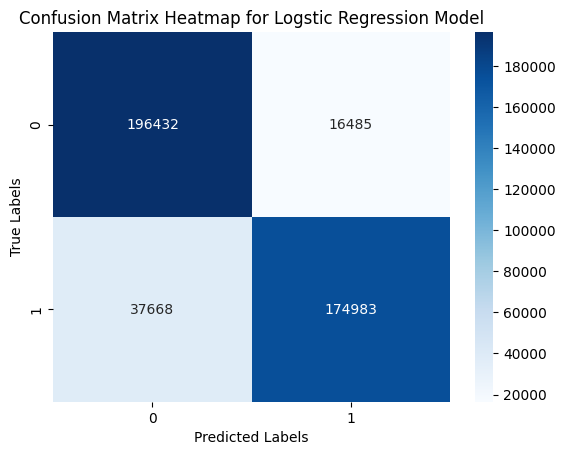

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

lr_cfm_data = confusion_matrix_lr.toPandas().drop(columns=['label']).values
# Create the heatmap
ax_lr = sns.heatmap(lr_cfm_data, annot=True, fmt='d', cmap='Blues')
ax_lr.set(xlabel='Predicted', ylabel='Actual');
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap for Logstic Regression Model')

plt.show()

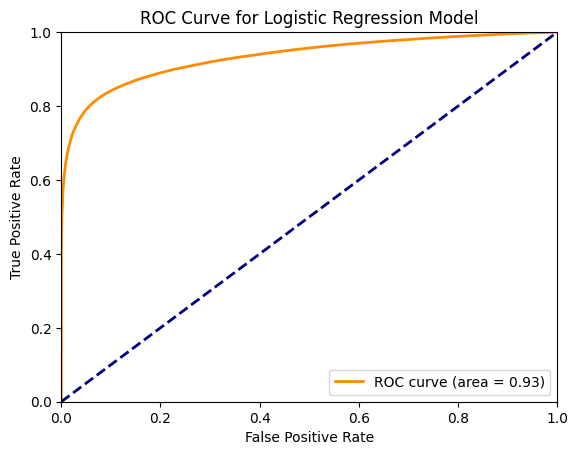

In [ ]:
from sklearn.metrics import roc_curve, auc

# Extract the probabilities and labels
probabilities_lr = predictions_lr.select("probability").rdd.map(lambda x: x[0][1]).collect()
labels_lr = predictions_lr.select("label").rdd.map(lambda x: x[0]).collect()

# Compute ROC curve and ROC area
fpr_lr, tpr_lr, _ = roc_curve(labels_lr, probabilities_lr)
roc_auc_lr = auc(fpr_lr, tpr_lr)

# Plot
plt.figure()
plt.plot(fpr_lr, tpr_lr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_lr)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Logistic Regression Model')
plt.legend(loc="lower right")
plt.show()

#### Decision Tree

##### Data Processing & Model Training

In [ ]:
# For methods such as decision tree and random forest, having a large number of features is not recommended
# Therefore, for these models we do not do one-hot encoding for columns of string data.

airline_indexer = StringIndexer(inputCol="AIRLINE", outputCol="AIRLINEIndex")

origin_indexer = StringIndexer(inputCol="ORIGIN_AIRPORT", outputCol="ORIGIN_AIRPORTIndex")

destination_indexer = StringIndexer(inputCol="DESTINATION_AIRPORT", outputCol="DESTINATION_AIRPORTIndex")

assembler_tree = VectorAssembler(inputCols = ["MONTH", "DAY", "AIRLINEIndex", "FLIGHT_NUMBER", "ORIGIN_AIRPORTIndex",
                                              "DESTINATION_AIRPORTIndex", "SCHEDULED_DEPARTURE", "DEPARTURE_DELAY",
                                              "DISTANCE", "SCHEDULED_ARRIVAL", "DIVERTED", "CANCELLED"],
                            outputCol='RAW_FEATURES')
min_max_scaler = MinMaxScaler(inputCol="RAW_FEATURES", outputCol="FEATURES")

pipeline_indexer = Pipeline(stages=[
    airline_indexer,
    origin_indexer,
    destination_indexer,
    assembler_tree,
    min_max_scaler
])
# Fit the pipeline to your data
pipeline_model_indexer = pipeline_indexer.fit(balanced_flights_delayed)

# Transform your data
transformed_flights_df_indexer = pipeline_model_indexer.transform(balanced_flights_delayed).select("FEATURES", "LABEL")
training_data_indexer, testing_data_indexer = transformed_flights_df_indexer.randomSplit([0.8, 0.2], seed=631)
training_data_indexer.cache()
testing_data_indexer.cache()

DataFrame[FEATURES: vector, LABEL: int]

In [ ]:
flights_selected.groupBy('CANCELLED').count().show()

+---------+-------+
|CANCELLED|  count|
+---------+-------+
|        1|  89884|
|        0|5729195|
+---------+-------+



In [ ]:
flights_delayed_label.groupBy('CANCELLED').count().show()

+---------+-------+
|CANCELLED|  count|
+---------+-------+
|        0|5714008|
+---------+-------+



In [ ]:
assembler_heatmap = VectorAssembler(inputCols = ["MONTH", "DAY", "AIRLINEIndex", "FLIGHT_NUMBER", "ORIGIN_AIRPORTIndex",
                                              "DESTINATION_AIRPORTIndex", "SCHEDULED_DEPARTURE", "DEPARTURE_DELAY",
                                              "DISTANCE", "SCHEDULED_ARRIVAL"],
                            outputCol='RAW_FEATURES')

pipeline_for_heatmap = Pipeline(stages=[
    airline_indexer,
    origin_indexer,
    destination_indexer,
    assembler_heatmap,
    min_max_scaler
])
pipeline_model_for_heatmap = pipeline_for_heatmap.fit(balanced_flights_delayed)
transformed_flights_df_for_heatmap = pipeline_model_for_heatmap.transform(balanced_flights_delayed).select("FEATURES", "LABEL")

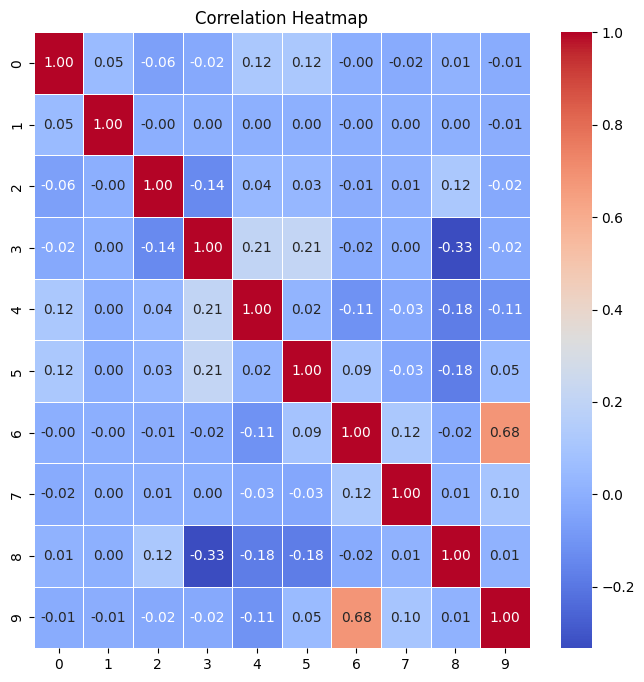

In [ ]:
correlation_matrix = Correlation.corr(transformed_flights_df_for_heatmap, "FEATURES").head()

# Extracting the correlation matrix as a NumPy array
correlation_matrix_array = correlation_matrix[0].toArray()

plt.figure(figsize=(8, 8))
sns.heatmap(correlation_matrix_array, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
from pyspark.ml.classification import DecisionTreeClassifier

# Create the trainer and set its parameters
dt = DecisionTreeClassifier(labelCol="LABEL", featuresCol="FEATURES", maxDepth=5, maxBins=32)

# Train the model
dt_model = dt.fit(training_data_indexer)
predictions_dt = dt_model.transform(testing_data_indexer)
predictions_dt.show()

+--------------------+-----+-------------------+--------------------+----------+
|            FEATURES|LABEL|      rawPrediction|         probability|prediction|
+--------------------+-----+-------------------+--------------------+----------+
|[0.0,0.0,0.0,0.00...|    0|[686097.0,103347.0]|[0.86908887774180...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[686097.0,103347.0]|[0.86908887774180...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[686097.0,103347.0]|[0.86908887774180...|       0.0|
|[0.0,0.0,0.0,0.01...|    0|  [46910.0,17297.0]|[0.73060569719812...|       0.0|
|[0.0,0.0,0.0,0.01...|    0|[686097.0,103347.0]|[0.86908887774180...|       0.0|
|[0.0,0.0,0.0,0.01...|    0|[686097.0,103347.0]|[0.86908887774180...|       0.0|
|[0.0,0.0,0.0,0.01...|    0|[686097.0,103347.0]|[0.86908887774180...|       0.0|
|[0.0,0.0,0.0,0.01...|    0|[686097.0,103347.0]|[0.86908887774180...|       0.0|
|[0.0,0.0,0.0,0.01...|    0|[686097.0,103347.0]|[0.86908887774180...|       0.0|
|[0.0,0.0,0.0,0.01...|    0|

##### Evaluation

In [ ]:
# Compute accuracy on the test set
dt_evaluator = BinaryClassificationEvaluator(rawPredictionCol = "prediction", labelCol="LABEL")
dt_accuracy = dt_evaluator.evaluate(predictions_dt)
print(f"Test Accuracy = {dt_accuracy}")

Test Accuracy = 0.8705761976552873


In [ ]:
confusion_matrix_dt = predictions_dt.groupBy('label').pivot('prediction', [0, 1]).count().na.fill(0).orderBy('label')
confusion_matrix_dt.show()

+-----+------+------+
|label|     0|     1|
+-----+------+------+
|    0|196968| 15949|
|    1| 39213|173438|
+-----+------+------+



In [ ]:
TN_dt = predictions_dt.filter('prediction = 0 AND label = 0').count()
TP_dt = predictions_dt.filter('prediction = 1 AND label = 1').count()
FN_dt = predictions_dt.filter('prediction = 0 AND label = 1').count()
FP_dt = predictions_dt.filter('prediction = 1 AND label = 0').count()

precision_dt = TP_dt / (TP_dt + FP_dt)
recall_dt = TP_dt / (TP_dt + FN_dt)

F_score_dt = (2 * precision_dt * recall_dt) / (precision_dt + recall_dt)

print(f"The precision of Decision Tree is: {precision_dt}.")
print(f"The recall of Decision Tree is: {recall_dt}.")

print(f"The F1-score of Decision Tree is: {F_score_dt}.")

The precision of Decision Tree is: 0.915786194406163.
The recall of Decision Tree is: 0.8155992682846542.
The F1-score of Decision Tree is: 0.8627940642426836.


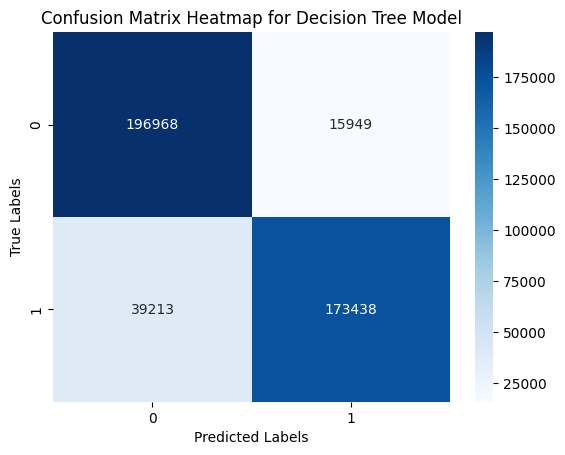

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

dt_cfm_data = confusion_matrix_dt.toPandas().drop(columns=['label']).values
# Create the heatmap
ax_dt = sns.heatmap(dt_cfm_data, annot=True, fmt='d', cmap='Blues')
ax_dt.set(xlabel='Predicted', ylabel='Actual');
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap for Decision Tree Model')

plt.show()

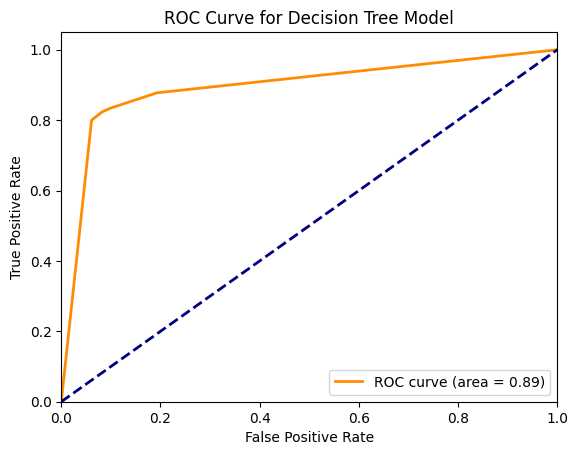

In [ ]:
# Extract the probabilities and labels
probabilities_dt = predictions_dt.select("probability").rdd.map(lambda x: x[0][1]).collect()
labels_dt = predictions_dt.select("label").rdd.map(lambda x: x[0]).collect()

# Compute ROC curve and ROC area
fpr_dt, tpr_dt, _ = roc_curve(labels_dt, probabilities_dt)
roc_auc_dt = auc(fpr_dt, tpr_dt)

# Plot
plt.figure()
plt.plot(fpr_dt, tpr_dt, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_dt)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Decision Tree Model')
plt.legend(loc="lower right")
plt.show()

#### Naive Bayes

In [ ]:
from pyspark.ml.classification import NaiveBayes
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Create the trainer and set its parameters
nb = NaiveBayes(labelCol="LABEL", featuresCol="FEATURES", smoothing=1, modelType="multinomial")

# Train the model
nb_model = nb.fit(training_data_indexer)

# Select example rows to display
predictions_nb = nb_model.transform(testing_data_indexer)
predictions_nb.show()

+--------------------+-----+--------------------+--------------------+----------+
|            FEATURES|LABEL|       rawPrediction|         probability|prediction|
+--------------------+-----+--------------------+--------------------+----------+
|[0.0,0.0,0.0,0.00...|    0|[-6.2367944808153...|[0.49296447436050...|       1.0|
|[0.0,0.0,0.0,0.00...|    0|[-5.2842033099793...|[0.48772349877221...|       1.0|
|[0.0,0.0,0.0,0.00...|    0|[-6.0902729807701...|[0.47938999971334...|       1.0|
|[0.0,0.0,0.0,0.01...|    0|[-7.0449337906899...|[0.46907501080904...|       1.0|
|[0.0,0.0,0.0,0.01...|    0|[-7.1463491101276...|[0.47649534449324...|       1.0|
|[0.0,0.0,0.0,0.01...|    0|[-4.9618049371197...|[0.49333109522147...|       1.0|
|[0.0,0.0,0.0,0.01...|    0|[-5.5751051985995...|[0.49161402796891...|       1.0|
|[0.0,0.0,0.0,0.01...|    0|[-6.9119389609804...|[0.47171858566289...|       1.0|
|[0.0,0.0,0.0,0.01...|    0|[-6.6981979202435...|[0.48053284625551...|       1.0|
|[0.0,0.0,0.0,0.

In [ ]:
predictions_nb.dtypes

[('FEATURES', 'vector'),
 ('LABEL', 'int'),
 ('rawPrediction', 'vector'),
 ('probability', 'vector'),
 ('prediction', 'double')]

##### Evaluation

In [ ]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator

# Compute accuracy on the test set
nb_evaluator = BinaryClassificationEvaluator(rawPredictionCol="prediction", labelCol="LABEL")
nb_accuracy = nb_evaluator.evaluate(predictions_nb)
print(f"Test Accuracy = {nb_accuracy}")

Test Accuracy = 0.6190904782727162


In [ ]:
confusion_matrix_nb = predictions_nb.groupBy('label').pivot('prediction', [0, 1]).count().na.fill(0).orderBy('label')
confusion_matrix_nb.show()

+-----+------+------+
|label|     0|     1|
+-----+------+------+
|    0|125334| 87583|
|    1| 74528|138123|
+-----+------+------+



In [ ]:
TN_nb = predictions_nb.filter('prediction = 0 AND label = 0').count()
TP_nb = predictions_nb.filter('prediction = 1 AND label = 1').count()
FN_nb = predictions_nb.filter('prediction = 0 AND label = 1').count()
FP_nb = predictions_nb.filter('prediction = 1 AND label = 0').count()

precision_nb = TP_nb / (TP_nb + FP_nb)
recall_nb = TP_nb / (TP_nb + FN_nb)

F_score_nb = (2 * precision_nb * recall_nb) / (precision_nb + recall_nb)

print(f"The precision of Naive Bayes is: {precision_nb}.")
print(f"The recall of Naive Bayes is: {recall_nb}.")

print(f"The F1-score of Naive Bayes is: {F_score_nb}.")

The precision of Naive Bayes is: 0.6119598061194651.
The recall of Naive Bayes is: 0.6495290405406041.
The F1-score of Naive Bayes is: 0.6301849862098701.


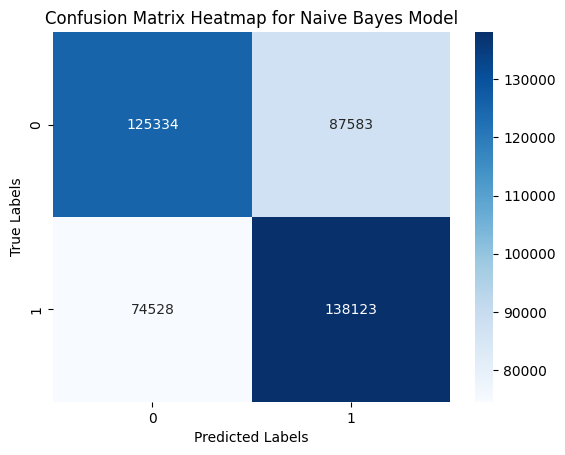

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

nb_cfm_data = confusion_matrix_nb.toPandas().drop(columns=['label']).values
# Create the heatmap
ax_nb = sns.heatmap(nb_cfm_data, annot=True, fmt='d', cmap='Blues')
ax_nb.set(xlabel='Predicted', ylabel='Actual');
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap for Naive Bayes Model')

plt.show()

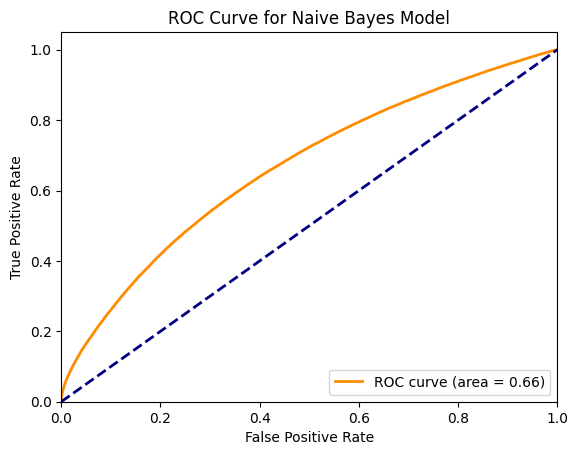

In [ ]:
# Extract the probabilities and labels
probabilities_nb = predictions_nb.select("probability").rdd.map(lambda x: x[0][1]).collect()
labels_nb = predictions_nb.select("label").rdd.map(lambda x: x[0]).collect()

# Compute ROC curve and ROC area
fpr_nb, tpr_nb, _ = roc_curve(labels_nb, probabilities_nb)
roc_auc_nb = auc(fpr_nb, tpr_nb)

# Plot
plt.figure()
plt.plot(fpr_nb, tpr_nb, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_nb)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Naive Bayes Model')
plt.legend(loc="lower right")
plt.show()

#### Random Forest

In [ ]:
# airline_indexer = StringIndexer(inputCol="AIRLINE", outputCol="AIRLINEIndex")

# origin_indexer = StringIndexer(inputCol="ORIGIN_AIRPORT", outputCol="ORIGIN_AIRPORTIndex")

# destination_indexer = StringIndexer(inputCol="DESTINATION_AIRPORT", outputCol="DESTINATION_AIRPORTIndex")

# assembler_tree = VectorAssembler(inputCols = ["MONTH", "DAY", "AIRLINEIndex", "FLIGHT_NUMBER", "ORIGIN_AIRPORTIndex",
#                                               "DESTINATION_AIRPORTIndex", "SCHEDULED_DEPARTURE", "DEPARTURE_DELAY",
#                                               "DISTANCE", "SCHEDULED_ARRIVAL", "DIVERTED", "CANCELLED"],
#                             outputCol='RAW_FEATURES')
# min_max_scaler = MinMaxScaler(inputCol="RAW_FEATURES", outputCol="FEATURES")

# pipeline_rf = Pipeline(stages=[
#     airline_indexer,
#     origin_indexer,
#     destination_indexer,
#     assembler_tree,
#     min_max_scaler
# ])
# # Fit the pipeline to your data
# pipeline_model_for_rf = pipeline_rf.fit(balanced_flights_delayed)

# # Transform your data
# transformed_flights_df_rf = pipeline_model_for_rf.transform(balanced_flights_delayed).select("FEATURES", "LABEL")
# training_data_rf, testing_data_rf = transformed_flights_df_rf.randomSplit([0.8, 0.2], seed=631)
# training_data_rf.cache()
# testing_data_rf.cache()

In [ ]:
from pyspark.ml.classification import RandomForestClassifier
# Create the trainer and set its parameters
rf = RandomForestClassifier(labelCol="LABEL", featuresCol="FEATURES", maxDepth = 15, numTrees = 10, maxBins = 32)

# Train the model
rf_model = rf.fit(training_data_indexer)

# Select example rows to display
predictions_rf = rf_model.transform(testing_data_indexer)
predictions_rf.show()

+--------------------+-----+--------------------+--------------------+----------+
|            FEATURES|LABEL|       rawPrediction|         probability|prediction|
+--------------------+-----+--------------------+--------------------+----------+
|[0.0,0.0,0.0,0.00...|    0|[9.33936442785942...|[0.93393644278594...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[9.32068152892884...|[0.93206815289288...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[9.47193606296159...|[0.94719360629615...|       0.0|
|[0.0,0.0,0.0,0.01...|    0|[8.03998080849048...|[0.80399808084904...|       0.0|
|[0.0,0.0,0.0,0.01...|    0|[8.65488552191019...|[0.86548855219101...|       0.0|
|[0.0,0.0,0.0,0.01...|    0|[7.92712134254664...|[0.79271213425466...|       0.0|
|[0.0,0.0,0.0,0.01...|    0|[9.48394547641106...|[0.94839454764110...|       0.0|
|[0.0,0.0,0.0,0.01...|    0|[8.34330332799467...|[0.83433033279946...|       0.0|
|[0.0,0.0,0.0,0.01...|    0|[7.96651368023212...|[0.79665136802321...|       0.0|
|[0.0,0.0,0.0,0.

##### Evaluation

In [ ]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator
# Compute accuracy on the test set
rf_evaluator = BinaryClassificationEvaluator(rawPredictionCol="prediction", labelCol="LABEL")
rf_accuracy = rf_evaluator.evaluate(predictions_rf)
print(f"Test Accuracy = {rf_accuracy}")

Test Accuracy = 0.8739074523056313


In [ ]:
confusion_matrix_rf = predictions_rf.groupBy('label').pivot('prediction', [0, 1]).count().na.fill(0).orderBy('label')
confusion_matrix_rf.show()

+-----+------+------+
|label|     0|     1|
+-----+------+------+
|    0|198039| 14878|
|    1| 38768|173883|
+-----+------+------+



In [ ]:
TN_rf = predictions_rf.filter('prediction = 0 AND label = 0').count()
TP_rf = predictions_rf.filter('prediction = 1 AND label = 1').count()
FN_rf = predictions_rf.filter('prediction = 0 AND label = 1').count()
FP_rf = predictions_rf.filter('prediction = 1 AND label = 0').count()

precision_rf = TP_rf / (TP_rf + FP_rf)
recall_rf = TP_rf / (TP_rf + FN_rf)

f_score_rf = (2 * precision_rf * recall_rf) / (precision_rf + recall_rf)

print(f"The precision of Random Forest is: {precision_rf}.")
print(f"The recall of Random Forest is: {recall_rf}.")

print(f"The F1-score of Random Forest is: {f_score_rf}.")

The precision of Random Forest is: 0.9211807523799938.
The recall of Random Forest is: 0.8176918989329935.
The F1-score of Random Forest is: 0.8663567606349586.


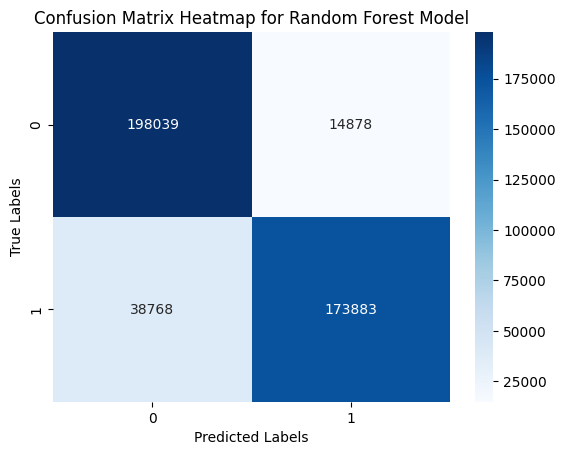

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

rf_cfm_data = confusion_matrix_rf.toPandas().drop(columns=['label']).values
# Create the heatmap
ax_dt = sns.heatmap(rf_cfm_data, annot=True, fmt='d', cmap='Blues')
ax_dt.set(xlabel='Predicted', ylabel='Actual');
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap for Random Forest Model')

plt.show()

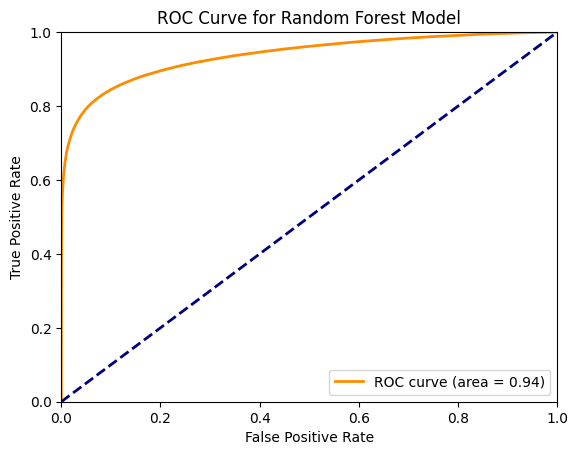

In [ ]:
from sklearn.metrics import roc_curve, auc
# Extract the probabilities and labels
probabilities_rf = predictions_rf.select("probability").rdd.map(lambda x: x[0][1]).collect()
labels_rf = predictions_rf.select("label").rdd.map(lambda x: x[0]).collect()

# Compute ROC curve and ROC area
fpr_rf, tpr_rf, _ = roc_curve(labels_rf, probabilities_rf)
roc_auc_rf = auc(fpr_rf, tpr_rf)

# Plot
plt.figure()
plt.plot(fpr_rf, tpr_rf, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_rf)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Random Forest Model')
plt.legend(loc="lower right")
plt.show()

### Hyper Paramerer Tuning


Test Accuracy = 0.869679465708116
Test Accuracy = 0.8710824649087545
Test Accuracy = 0.8735330320890777


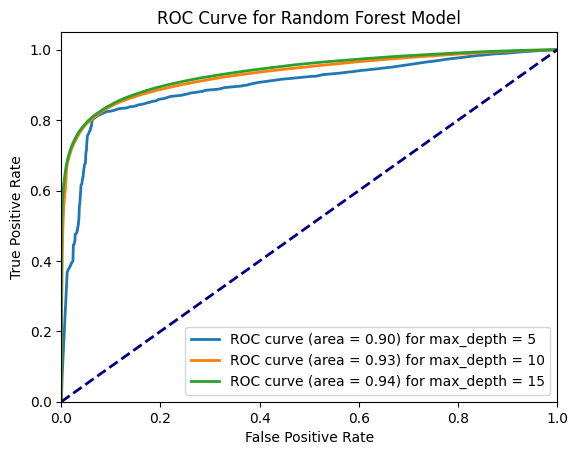

In [ ]:
# Hyper Paramerer Tuning
from pyspark.ml.classification import RandomForestClassifier


depth_lst = [5, 10, 15]

plt.figure()

for depth in depth_lst:
    # Create the trainer and set its parameters
    rf = RandomForestClassifier(labelCol="LABEL", featuresCol="FEATURES", maxDepth = depth, numTrees=10)

    # Train the model
    rf_model = rf.fit(training_data_indexer)

    # Select example rows to display
    predictions_rf = rf_model.transform(testing_data_indexer)

    # Compute accuracy on the test set
    tune_evaluator = BinaryClassificationEvaluator(rawPredictionCol="prediction", labelCol="LABEL")
    rf_accuracy = tune_evaluator.evaluate(predictions_rf)
    print(f"Test Accuracy = {rf_accuracy}")

    confusion_matrix_rf = predictions_rf.groupBy('label').pivot('prediction', [0, 1]).count().na.fill(0).orderBy('label')

    # Extract the probabilities and labels
    probabilities_rf = predictions_rf.select("probability").rdd.map(lambda x: x[0][1]).collect()
    labels_rf = predictions_rf.select("label").rdd.map(lambda x: x[0]).collect()

    # Compute ROC curve and ROC area
    fpr, tpr, _ = roc_curve(labels_rf, probabilities_rf)
    roc_auc = auc(fpr, tpr)

    # Plot
    plt.plot(fpr, tpr, lw=2, label='ROC curve (area = %0.2f) for max_depth = %d' % (roc_auc, depth))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Random Forest Model')
plt.legend(loc="lower right")
plt.show()

### Compare the ROC curve of all 4 methods


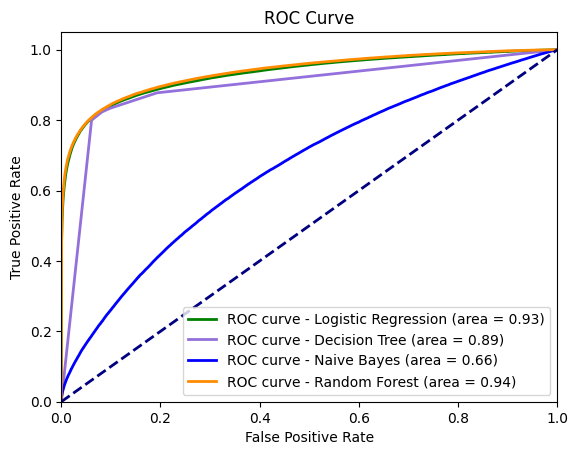

In [ ]:
# Plot
plt.figure()
plt.plot(fpr_lr, tpr_lr, color='green', lw=2, label='ROC curve - Logistic Regression (area = %0.2f)' % roc_auc_lr)
plt.plot(fpr_dt, tpr_dt, color='mediumpurple', lw=2, label='ROC curve - Decision Tree (area = %0.2f)' % roc_auc_dt)
plt.plot(fpr_nb, tpr_nb, color='blue', lw=2, label='ROC curve - Naive Bayes (area = %0.2f)' % roc_auc_nb)
plt.plot(fpr_rf, tpr_rf, color='darkorange', lw=2, label='ROC curve - Random Forest (area = %0.2f)' % roc_auc_rf)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

# UPDATED VERSION: Apply machine learning models to predict delays

#### Data cleaning

In [ ]:
# Print the number of records with missing 'delay' values
num_no_delay = flights_selected.filter("ARRIVAL_DELAY IS NULL").count()
print(f"The number of records that missing delay values is {num_no_delay}.")

The number of records that missing delay values is 105071.


In [ ]:
# Remove records with missing 'delay' values
flights_delayed = flights_selected.filter("ARRIVAL_DELAY IS NOT NULL")

# Count the remaining rows
print(f"""The original flights count is {flights.count()} and after removing the missing delay values is {flights_delayed.count()}.""")

The original flights count is 5819079 and after removing the missing delay values is 5714008.


#### Create delay label

How to define "delay"? A flight delay occurs when an airline flight takes off and/or lands later than its scheduled time. The United States Federal Aviation Administration (FAA) considers a flight to be delayed when it is 15 minutes later than its scheduled time.

Then our label 0: no delay and 1: delay

In [ ]:
from pyspark.sql.types import *

# Add a new column "delay"
flights_delayed_label = flights_delayed.withColumn("LABEL", (flights_selected.ARRIVAL_DELAY >= 15).cast(IntegerType()))
flights_delayed_label.show()

+-----+---+-------+-------------+--------------+-------------------+-------------------+---------------+--------+-----------------+------------+-------------+--------+---------+-----+
|MONTH|DAY|AIRLINE|FLIGHT_NUMBER|ORIGIN_AIRPORT|DESTINATION_AIRPORT|SCHEDULED_DEPARTURE|DEPARTURE_DELAY|DISTANCE|SCHEDULED_ARRIVAL|ARRIVAL_TIME|ARRIVAL_DELAY|DIVERTED|CANCELLED|LABEL|
+-----+---+-------+-------------+--------------+-------------------+-------------------+---------------+--------+-----------------+------------+-------------+--------+---------+-----+
|    1|  1|     AS|           98|           ANC|                SEA|                  5|            -11|    1448|              430|         408|          -22|       0|        0|    0|
|    1|  1|     AA|         2336|           LAX|                PBI|                 10|             -8|    2330|              750|         741|           -9|       0|        0|    0|
|    1|  1|     US|          840|           SFO|                CLT|            

In [ ]:
from pyspark.sql.functions import expr
delay_each_airline = flights_delayed_label.groupBy('AIRLINE', 'LABEL').count().join(flights_delayed_label.groupBy("AIRLINE").count().withColumnRenamed("count", "total_count"), 'AIRLINE').filter("LABEL = 1")
delay_percent_each_airline = delay_each_airline.withColumn("percentage", delay_each_airline["count"] / delay_each_airline["total_count"])
delay_percent_each_airline.show()

+-------+-----+------+-----------+-------------------+
|AIRLINE|LABEL| count|total_count|         percentage|
+-------+-----+------+-----------+-------------------+
|     UA|    1|104722|     507762| 0.2062422946183448|
|     NK|    1| 34221|     115193| 0.2970753431198076|
|     AA|    1|130279|     712935|0.18273615406734134|
|     EV|    1|109184|     554752| 0.1968158744808491|
|     B6|    1| 59175|     262042|0.22582257806000564|
|     DL|    1|118023|     870275|0.13561575364109046|
|     OO|    1|107795|     576814|0.18687999944522846|
|     F9|    1| 23570|      90090|0.26162726162726163|
|     US|    1| 36549|     194223|0.18818059653079192|
|     MQ|    1| 60547|     278791|0.21717702508330614|
|     HA|    1|  8618|      76041|0.11333359634933786|
|     AS|    1| 22352|     171439|0.13037873529360297|
|     VX|    1| 11778|      61248| 0.1923001567398119|
|     WN|    1|236626|    1242403| 0.1904583295436344|
+-------+-----+------+-----------+-------------------+



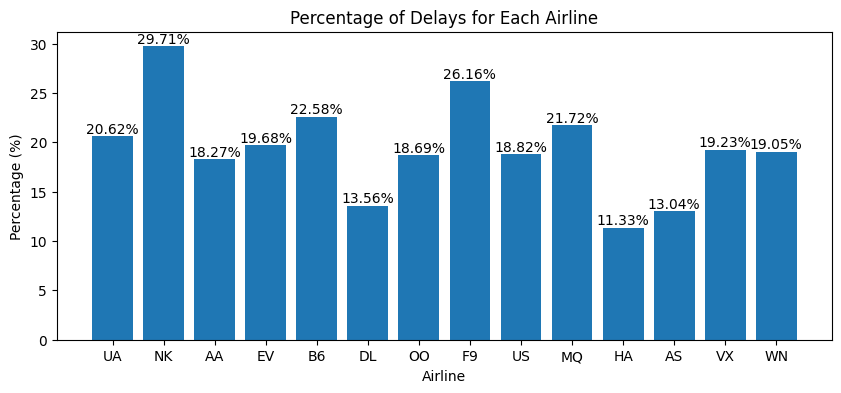

In [ ]:
import matplotlib.pyplot as plt
delay_percent_pd = delay_percent_each_airline.toPandas()

# Plot a bar graph
fig, ax = plt.subplots(figsize=(10, 4))
bars = ax.bar(delay_percent_pd["AIRLINE"], round(delay_percent_pd["percentage"] * 100, 2))

# Add number labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"{round(yval, 2)}%", ha='center', va='bottom')

plt.title("Percentage of Delays for Each Airline")
plt.xlabel("Airline")
plt.ylabel("Percentage (%)")
plt.show()

In [ ]:
# Determine the counts of the target value
print('Labels distrubution:')
flights_delayed_label.groupBy('label').count().show()

Labels distrubution:
+-----+-------+
|label|  count|
+-----+-------+
|    1|1063439|
|    0|4650569|
+-----+-------+



In [ ]:
# # Dealing with imbalance data
# major_class_flights = training_data.filter(flights_delayed_label.LABEL == 0)
# minor_class_flights = training_data.filter(flights_delayed_label.LABEL == 1)
# ratio = minor_class_flights.count() / major_class_flights.count()
# balanced_training  = major_class_flights.sample(withReplacement=False, fraction=ratio, seed=631).unionAll(minor_class_flights)

# # Determine the counts of the target value
# print('Delay label distrubution:')
# balanced_training.groupBy('label').count().show()

Delay label distrubution:
+-----+------+
|label| count|
+-----+------+
|    0|850935|
|    1|850451|
+-----+------+



In [ ]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler, StandardScaler, MinMaxScaler
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import BinaryClassificationEvaluator

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, auc
from pyspark.ml.stat import Correlation

#### Logstic Regression

##### Data Processing & Model Training

In [ ]:
# Apply One-hot Encoding to string columns
airline_indexer = StringIndexer(inputCol="AIRLINE", outputCol="AIRLINEIndex")
airline_encoder = OneHotEncoder(inputCol="AIRLINEIndex", outputCol="AIRLINEVec")

origin_indexer = StringIndexer(inputCol="ORIGIN_AIRPORT", outputCol="ORIGIN_AIRPORTIndex")
origin_encoder = OneHotEncoder(inputCol="ORIGIN_AIRPORTIndex", outputCol="ORIGIN_AIRPORTVec")

destination_indexer = StringIndexer(inputCol="DESTINATION_AIRPORT", outputCol="DESTINATION_AIRPORTIndex")
destination_encoder = OneHotEncoder(inputCol="DESTINATION_AIRPORTIndex", outputCol="DESTINATION_AIRPORTVec")

assembler = VectorAssembler(inputCols = ["MONTH", "DAY", "AIRLINEVec", "FLIGHT_NUMBER", "ORIGIN_AIRPORTVec",
                                         "DESTINATION_AIRPORTVec", "SCHEDULED_DEPARTURE", "DEPARTURE_DELAY",
                                         "DISTANCE", "SCHEDULED_ARRIVAL", "DIVERTED", "CANCELLED"],
                            outputCol='RAW_FEATURES')

scaler = StandardScaler(inputCol="RAW_FEATURES", outputCol="FEATURES",
                        withStd=True, withMean=False)

# Initialize the Pipeline
pipeline_encoder = Pipeline(stages=[
    airline_indexer, airline_encoder,
    origin_indexer, origin_encoder,
    destination_indexer, destination_encoder,
    assembler,
    scaler
])

# Fit the pipeline to your data
pipeline_model_encoder = pipeline_encoder.fit(flights_delayed_label)

# Transform your data
# transformed_flights_df = pipeline_model.transform(flights_delayed_label)
transformed_flights_df = pipeline_model_encoder.transform(flights_delayed_label).select("FEATURES", "LABEL")
ub_training_data_encoder, testing_data_encoder = transformed_flights_df.randomSplit([0.9, 0.1], seed=631)

In [ ]:
# Dealing with imbalance data
major_class_flights = ub_training_data_encoder.filter(ub_training_data_encoder.LABEL == 0)
minor_class_flights = ub_training_data_encoder.filter(ub_training_data_encoder.LABEL == 1)
ratio = minor_class_flights.select("LABEL").count() / major_class_flights.select("LABEL").count()
training_data_encoder  = major_class_flights.sample(withReplacement=False, fraction=ratio, seed=631).unionAll(minor_class_flights)

# Determine the counts of the target value
print('Delay label distrubution:')
training_data_encoder.select("LABEL").groupBy('label').count().show()

training_data_encoder.cache()
testing_data_encoder.cache()

Delay label distrubution:
+-----+------+
|label| count|
+-----+------+
|    0|958120|
|    1|957572|
+-----+------+



DataFrame[FEATURES: vector, LABEL: int]

In [ ]:
# # Apply One-hot Encoding to string columns
# airline_indexer = StringIndexer(inputCol="AIRLINE", outputCol="AIRLINEIndex")
# airline_encoder = OneHotEncoder(inputCol="AIRLINEIndex", outputCol="AIRLINEVec")

# origin_indexer = StringIndexer(inputCol="ORIGIN_AIRPORT", outputCol="ORIGIN_AIRPORTIndex")
# origin_encoder = OneHotEncoder(inputCol="ORIGIN_AIRPORTIndex", outputCol="ORIGIN_AIRPORTVec")

# destination_indexer = StringIndexer(inputCol="DESTINATION_AIRPORT", outputCol="DESTINATION_AIRPORTIndex")
# destination_encoder = OneHotEncoder(inputCol="DESTINATION_AIRPORTIndex", outputCol="DESTINATION_AIRPORTVec")

# assembler = VectorAssembler(inputCols = ["MONTH", "DAY", "AIRLINEVec", "FLIGHT_NUMBER", "ORIGIN_AIRPORTVec",
#                                          "DESTINATION_AIRPORTVec", "SCHEDULED_DEPARTURE", "DEPARTURE_DELAY",
#                                          "DISTANCE", "SCHEDULED_ARRIVAL", "DIVERTED", "CANCELLED"],
#                             outputCol='RAW_FEATURES')

# scaler = MinMaxScaler(inputCol="RAW_FEATURES", outputCol="FEATURES")

# # Initialize the Pipeline
# pipeline_encoder = Pipeline(stages=[
#     airline_indexer, airline_encoder,
#     origin_indexer, origin_encoder,
#     destination_indexer, destination_encoder,
#     assembler,
#     scaler
# ])

# # Fit the pipeline to your data
# pipeline_model_encoder = pipeline_encoder.fit(balanced_training)
# pipeline_model_encoder_test = pipeline_encoder.fit(testing_data)

# # Transform your data
# # transformed_flights_df = pipeline_model.transform(flights_delayed_label)
# training_data_encoder = pipeline_model_encoder.transform(balanced_training).select("FEATURES", "LABEL")
# testing_data_encoder = pipeline_model_encoder_test.transform(testing_data).select("FEATURES", "LABEL")

# training_data_encoder.cache()
# testing_data_encoder.cache()

DataFrame[FEATURES: vector, LABEL: int]

In [ ]:
# Import the logistic regression class
from pyspark.ml.classification import LogisticRegression

# Create a classifier object
logistic = LogisticRegression(labelCol="LABEL", featuresCol="FEATURES")
logistic_model = logistic.fit(training_data_encoder)
predictions_lr = logistic_model.transform(testing_data_encoder)
predictions_lr.show()

+--------------------+-----+--------------------+--------------------+----------+
|            FEATURES|LABEL|       rawPrediction|         probability|prediction|
+--------------------+-----+--------------------+--------------------+----------+
|(1277,[0,1,2,15,1...|    1|[-6.5639181269485...|[0.00140836266155...|       1.0|
|(1277,[0,1,2,15,1...|    0|[1.82053017825614...|[0.86062973206323...|       0.0|
|(1277,[0,1,2,15,1...|    0|[-1.5589664905659...|[0.17379499891790...|       1.0|
|(1277,[0,1,2,15,1...|    0|[1.90731069468076...|[0.87071671682875...|       0.0|
|(1277,[0,1,2,15,1...|    1|[-2.3614153383813...|[0.08616268732859...|       1.0|
|(1277,[0,1,2,15,1...|    0|[2.67669437588675...|[0.93563734500090...|       0.0|
|(1277,[0,1,2,15,1...|    0|[2.85336585556834...|[0.94549240757924...|       0.0|
|(1277,[0,1,2,15,1...|    0|[2.35643902589065...|[0.91344467662333...|       0.0|
|(1277,[0,1,2,15,1...|    0|[2.61711883593788...|[0.93195522554684...|       0.0|
|(1277,[0,1,2,15

In [ ]:
predictions_lr.dtypes

[('FEATURES', 'vector'),
 ('LABEL', 'int'),
 ('rawPrediction', 'vector'),
 ('probability', 'vector'),
 ('prediction', 'double')]

##### Evaluation

In [ ]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator
lr_evaluator = BinaryClassificationEvaluator(rawPredictionCol="prediction", labelCol="LABEL")
accuracy_lr = lr_evaluator.evaluate(predictions_lr)
print(f"Test Accuracy = {accuracy_lr}")

Test Accuracy = 0.8722575342831365


In [ ]:
confusion_matrix_lr = predictions_lr.groupBy('label').pivot('prediction', [0, 1]).count().orderBy('label')
confusion_matrix_lr.show()

+-----+------+-----+
|label|     0|    1|
+-----+------+-----+
|    0|427925|36258|
|    1| 18778|87089|
+-----+------+-----+



In [ ]:
TN_lr = predictions_lr.filter('prediction = 0 AND label = 0').count()
TP_lr = predictions_lr.filter('prediction = 1 AND label = 1').count()
FN_lr = predictions_lr.filter('prediction = 0 AND label = 1').count()
FP_lr = predictions_lr.filter('prediction = 1 AND label = 0').count()

precision_lr = TP_lr / (TP_lr + FP_lr)
recall_lr = TP_lr / (TP_lr + FN_lr)

F_score_lr = (2 * precision_lr * recall_lr) / (precision_lr + recall_lr)

print(f"The precision of Logistic Regression is: {precision_lr}.")
print(f"The recall of Logistic Regression is: {recall_lr}.")

print(f"The F1-score of Logistic Regression is: {F_score_lr}.")

The precision of Logistic Regression is: 0.7060487891882251.
The recall of Logistic Regression is: 0.8226265030651667.
The F1-score of Logistic Regression is: 0.7598925022031813.


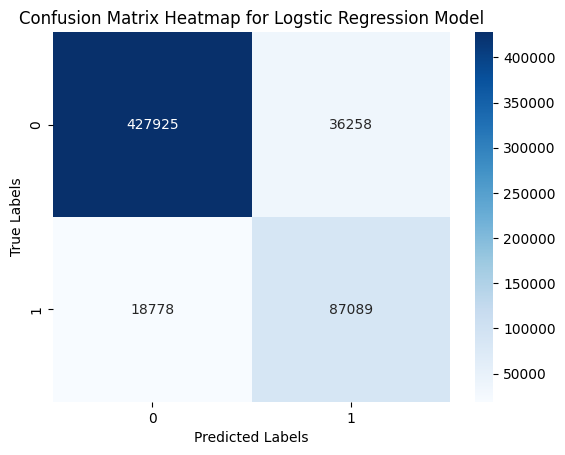

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

lr_cfm_data = confusion_matrix_lr.toPandas().drop(columns=['label']).values
# Create the heatmap
ax_lr = sns.heatmap(lr_cfm_data, annot=True, fmt='d', cmap='Blues')
ax_lr.set(xlabel='Predicted', ylabel='Actual');
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap for Logstic Regression Model')

plt.show()

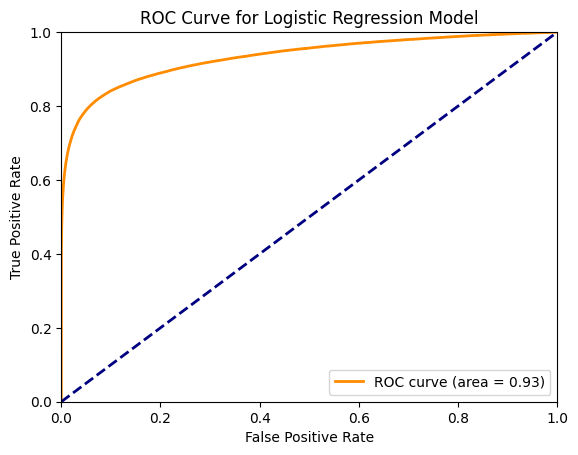

In [ ]:
from sklearn.metrics import roc_curve, auc

# Extract the probabilities and labels
probabilities_lr = predictions_lr.select("probability").rdd.map(lambda x: x[0][1]).collect()
labels_lr = predictions_lr.select("label").rdd.map(lambda x: x[0]).collect()

# Compute ROC curve and ROC area
fpr_lr, tpr_lr, _ = roc_curve(labels_lr, probabilities_lr)
roc_auc_lr = auc(fpr_lr, tpr_lr)

# Plot
plt.figure()
plt.plot(fpr_lr, tpr_lr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_lr)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Logistic Regression Model')
plt.legend(loc="lower right")
plt.show()

#### Decision Tree

##### Data Processing & Model Training

In [ ]:
# # Apply One-hot Encoding to string columns
# airline_indexer = StringIndexer(inputCol="AIRLINE", outputCol="AIRLINEIndex")

# origin_indexer = StringIndexer(inputCol="ORIGIN_AIRPORT", outputCol="ORIGIN_AIRPORTIndex")

# destination_indexer = StringIndexer(inputCol="DESTINATION_AIRPORT", outputCol="DESTINATION_AIRPORTIndex")

# assembler_tree = VectorAssembler(inputCols = ["MONTH", "DAY", "AIRLINEIndex", "FLIGHT_NUMBER", "ORIGIN_AIRPORTIndex",
#                                               "DESTINATION_AIRPORTIndex", "SCHEDULED_DEPARTURE", "DEPARTURE_DELAY",
#                                               "DISTANCE", "SCHEDULED_ARRIVAL", "DIVERTED", "CANCELLED"]
#                                 outputCol='RAW_FEATURES')
# scaler = MinMaxScaler(inputCol="RAW_FEATURES", outputCol="FEATURES")

# # Initialize the Pipeline
# pipeline_indexer = Pipeline(stages=[
#     airline_indexer,
#     origin_indexer,
#     destination_indexer,
#     assembler_tree,
#     scaler
# ])

# # Fit the pipeline to your data
# pipeline_model_indexer = pipeline_indexer.fit(balanced_training)
# pipeline_model_indexer_test = pipeline_indexer.fit(testing_data)

# # Transform your data
# # transformed_flights_df = pipeline_model.transform(flights_delayed_label)
# training_data_indexer = pipeline_model_indexer.transform(balanced_training).select("FEATURES", "LABEL")
# testing_data_indexer = pipeline_model_indexer_test.transform(testing_data).select("FEATURES", "LABEL")

# training_data_indexer.cache()
# testing_data_indexer.cache()

In [ ]:
# Apply One-hot Encoding to string columns
airline_indexer = StringIndexer(inputCol="AIRLINE", outputCol="AIRLINEIndex")

origin_indexer = StringIndexer(inputCol="ORIGIN_AIRPORT", outputCol="ORIGIN_AIRPORTIndex")

destination_indexer = StringIndexer(inputCol="DESTINATION_AIRPORT", outputCol="DESTINATION_AIRPORTIndex")

assembler_tree = VectorAssembler(inputCols = ["MONTH", "DAY", "AIRLINEIndex", "FLIGHT_NUMBER", "ORIGIN_AIRPORTIndex",
                                              "DESTINATION_AIRPORTIndex", "SCHEDULED_DEPARTURE", "DEPARTURE_DELAY",
                                              "DISTANCE", "SCHEDULED_ARRIVAL", "DIVERTED", "CANCELLED"],
                                outputCol='RAW_FEATURES')
scaler = MinMaxScaler(inputCol="RAW_FEATURES", outputCol="FEATURES")

# Initialize the Pipeline
pipeline_indexer = Pipeline(stages=[
    airline_indexer,
    origin_indexer,
    destination_indexer,
    assembler_tree,
    scaler
])

# Fit the pipeline to your data
pipeline_model_indexer = pipeline_indexer.fit(flights_delayed_label)

# Transform your data
# transformed_flights_df = pipeline_model.transform(flights_delayed_label)
transformed_flights_df_indexer = pipeline_model_indexer.transform(flights_delayed_label).select("FEATURES", "LABEL")
ub_training_data_indexer, testing_data_indexer = transformed_flights_df_indexer.randomSplit([0.9, 0.1], seed=631)

In [ ]:
# Dealing with imbalance data
major_class_flights_idx = ub_training_data_indexer.filter(ub_training_data_indexer.LABEL == 0)
minor_class_flights_idx = ub_training_data_indexer.filter(ub_training_data_indexer.LABEL == 1)
ratio_idx = minor_class_flights_idx.select("LABEL").count() / major_class_flights_idx.select("LABEL").count()
training_data_indexer  = major_class_flights_idx.sample(withReplacement=False, fraction=ratio_idx, seed=631).unionAll(minor_class_flights_idx)

# Determine the counts of the target value
print('Delay label distrubution:')
training_data_indexer.select("LABEL").groupBy('label').count().show()

training_data_indexer.cache()
testing_data_indexer.cache()

Delay label distrubution:
+-----+------+
|label| count|
+-----+------+
|    0|957591|
|    1|957086|
+-----+------+



DataFrame[FEATURES: vector, LABEL: int]

In [ ]:
assembler_heatmap = VectorAssembler(inputCols = ["LABEL", "MONTH", "DAY", "AIRLINEIndex", "FLIGHT_NUMBER", "ORIGIN_AIRPORTIndex",
                                              "DESTINATION_AIRPORTIndex", "SCHEDULED_DEPARTURE", "DEPARTURE_DELAY",
                                              "DISTANCE", "SCHEDULED_ARRIVAL"],
                            outputCol='RAW_FEATURES')

pipeline_for_heatmap = Pipeline(stages=[
    airline_indexer,
    origin_indexer,
    destination_indexer,
    assembler_heatmap,
    scaler
])
pipeline_model_for_heatmap = pipeline_for_heatmap.fit(flights_delayed_label)
transformed_flights_df_for_heatmap = pipeline_model_for_heatmap.transform(flights_delayed_label).select("FEATURES", "LABEL")

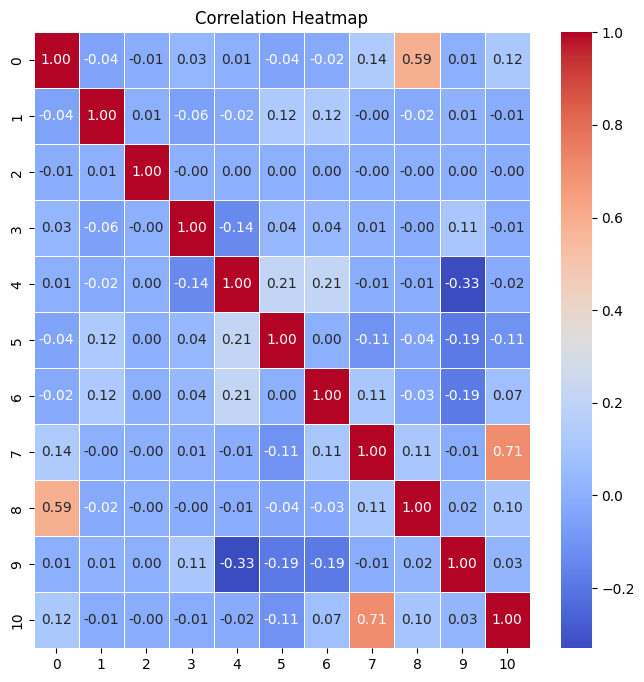

In [ ]:
correlation_matrix = Correlation.corr(transformed_flights_df_for_heatmap, "FEATURES").head()

# Extracting the correlation matrix as a NumPy array
correlation_matrix_array = correlation_matrix[0].toArray()

plt.figure(figsize=(8, 8))
sns.heatmap(correlation_matrix_array, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
from pyspark.ml.classification import DecisionTreeClassifier

# Create the trainer and set its parameters
dt = DecisionTreeClassifier(labelCol="LABEL", featuresCol="FEATURES", maxDepth=5, maxBins=32)

# Train the model
dt_model = dt.fit(training_data_indexer)
predictions_dt = dt_model.transform(testing_data_indexer)
predictions_dt.show()

+--------------------+-----+-------------------+--------------------+----------+
|            FEATURES|LABEL|      rawPrediction|         probability|prediction|
+--------------------+-----+-------------------+--------------------+----------+
|[0.0,0.0,0.0,0.00...|    0|[772518.0,116518.0]|[0.86893894060532...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[772518.0,116518.0]|[0.86893894060532...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[772518.0,116518.0]|[0.86893894060532...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[772518.0,116518.0]|[0.86893894060532...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[772518.0,116518.0]|[0.86893894060532...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[772518.0,116518.0]|[0.86893894060532...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[772518.0,116518.0]|[0.86893894060532...|       0.0|
|[0.0,0.0,0.0,0.00...|    0| [66167.0,774279.0]|[0.07872843704414...|       1.0|
|[0.0,0.0,0.0,0.00...|    0|[772518.0,116518.0]|[0.86893894060532...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|

##### Evaluation

In [ ]:
# Compute accuracy on the test set
dt_evaluator = BinaryClassificationEvaluator(rawPredictionCol = "prediction", labelCol="LABEL")
dt_accuracy = dt_evaluator.evaluate(predictions_dt)
print(f"Test Accuracy = {dt_accuracy}")

Test Accuracy = 0.8709650762971138


In [ ]:
confusion_matrix_dt = predictions_dt.groupBy('label').pivot('prediction', [0, 1]).count().na.fill(0).orderBy('label')
confusion_matrix_dt.show()

+-----+------+-----+
|label|     0|    1|
+-----+------+-----+
|    0|434036|29661|
|    1| 20651|85702|
+-----+------+-----+



In [ ]:
TN_dt = predictions_dt.filter('prediction = 0 AND label = 0').count()
TP_dt = predictions_dt.filter('prediction = 1 AND label = 1').count()
FN_dt = predictions_dt.filter('prediction = 0 AND label = 1').count()
FP_dt = predictions_dt.filter('prediction = 1 AND label = 0').count()

precision_dt = TP_dt / (TP_dt + FP_dt)
recall_dt = TP_dt / (TP_dt + FN_dt)

F_score_dt = (2 * precision_dt * recall_dt) / (precision_dt + recall_dt)

print(f"The precision of Decision Tree is: {precision_dt}.")
print(f"The recall of Decision Tree is: {recall_dt}.")

print(f"The F1-score of Decision Tree is: {F_score_dt}.")

The precision of Decision Tree is: 0.7428898346956997.
The recall of Decision Tree is: 0.8058258817334725.
The F1-score of Decision Tree is: 0.7730790741308702.


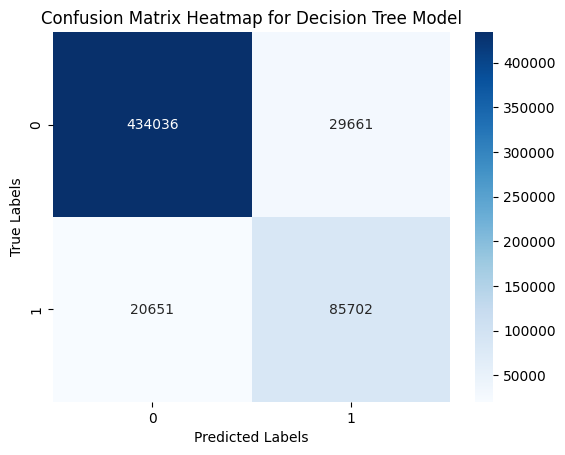

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

dt_cfm_data = confusion_matrix_dt.toPandas().drop(columns=['label']).values
# Create the heatmap
ax_dt = sns.heatmap(dt_cfm_data, annot=True, fmt='d', cmap='Blues')
ax_dt.set(xlabel='Predicted', ylabel='Actual');
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap for Decision Tree Model')

plt.show()

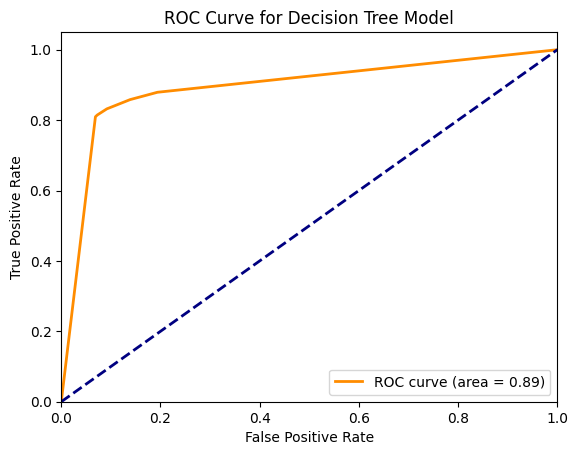

In [ ]:
# Extract the probabilities and labels
probabilities_dt = predictions_dt.select("probability").rdd.map(lambda x: x[0][1]).collect()
labels_dt = predictions_dt.select("label").rdd.map(lambda x: x[0]).collect()

# Compute ROC curve and ROC area
fpr_dt, tpr_dt, _ = roc_curve(labels_dt, probabilities_dt)
roc_auc_dt = auc(fpr_dt, tpr_dt)

# Plot
plt.figure()
plt.plot(fpr_dt, tpr_dt, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_dt)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Decision Tree Model')
plt.legend(loc="lower right")
plt.show()

#### Naive Bayes

In [ ]:
from pyspark.ml.classification import NaiveBayes
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Create the trainer and set its parameters
nb = NaiveBayes(labelCol="LABEL", featuresCol="FEATURES", smoothing=1, modelType="multinomial")

# Train the model
nb_model = nb.fit(training_data_indexer)

# Select example rows to display
predictions_nb = nb_model.transform(testing_data_indexer)
predictions_nb.show()

+--------------------+-----+--------------------+--------------------+----------+
|            FEATURES|LABEL|       rawPrediction|         probability|prediction|
+--------------------+-----+--------------------+--------------------+----------+
|[0.0,0.0,0.0,0.00...|    0|[-6.5051312467229...|[0.48306655917155...|       1.0|
|[0.0,0.0,0.0,0.00...|    0|[-6.0877333597804...|[0.50367254447853...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[-5.1400607694104...|[0.48905509102745...|       1.0|
|[0.0,0.0,0.0,0.00...|    0|[-5.5971948923967...|[0.48458730488377...|       1.0|
|[0.0,0.0,0.0,0.00...|    0|[-5.4187798662858...|[0.48813876011472...|       1.0|
|[0.0,0.0,0.0,0.00...|    0|[-6.4281668221750...|[0.47997747190878...|       1.0|
|[0.0,0.0,0.0,0.00...|    0|[-6.1252228923448...|[0.47915615243375...|       1.0|
|[0.0,0.0,0.0,0.00...|    0|[-7.2482952819763...|[0.47430063865170...|       1.0|
|[0.0,0.0,0.0,0.00...|    0|[-7.3476194525163...|[0.47434830466726...|       1.0|
|[0.0,0.0,0.0,0.

In [ ]:
predictions_nb.dtypes

[('FEATURES', 'vector'),
 ('LABEL', 'int'),
 ('rawPrediction', 'vector'),
 ('probability', 'vector'),
 ('prediction', 'double')]

##### Evaluation

In [ ]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator

# Compute accuracy on the test set
nb_evaluator = BinaryClassificationEvaluator(rawPredictionCol="prediction", labelCol="LABEL")
nb_accuracy = nb_evaluator.evaluate(predictions_nb)
print(f"Test Accuracy = {nb_accuracy}")

Test Accuracy = 0.6120739611268176


In [ ]:
confusion_matrix_nb = predictions_nb.groupBy('label').pivot('prediction', [0, 1]).count().na.fill(0).orderBy('label')
confusion_matrix_nb.show()

+-----+------+------+
|label|     0|     1|
+-----+------+------+
|    0|273165|190532|
|    1| 38814| 67539|
+-----+------+------+



In [ ]:
TN_nb = predictions_nb.filter('prediction = 0 AND label = 0').count()
TP_nb = predictions_nb.filter('prediction = 1 AND label = 1').count()
FN_nb = predictions_nb.filter('prediction = 0 AND label = 1').count()
FP_nb = predictions_nb.filter('prediction = 1 AND label = 0').count()

precision_nb = TP_nb / (TP_nb + FP_nb)
recall_nb = TP_nb / (TP_nb + FN_nb)

F_score_nb = (2 * precision_nb * recall_nb) / (precision_nb + recall_nb)

print(f"The precision of Naive Bayes is: {precision_nb}.")
print(f"The recall of Naive Bayes is: {recall_nb}.")

print(f"The F1-score of Naive Bayes is: {F_score_nb}.")

The precision of Naive Bayes is: 0.26170704961037855.
The recall of Naive Bayes is: 0.635045555837635.
The F1-score of Naive Bayes is: 0.37066164687287334.


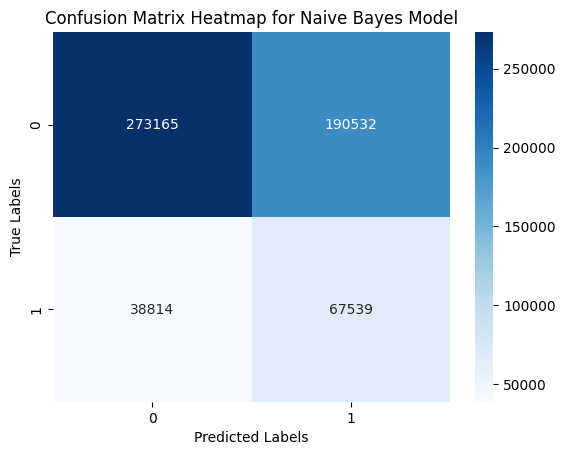

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

nb_cfm_data = confusion_matrix_nb.toPandas().drop(columns=['label']).values
# Create the heatmap
ax_nb = sns.heatmap(nb_cfm_data, annot=True, fmt='d', cmap='Blues')
ax_nb.set(xlabel='Predicted', ylabel='Actual');
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap for Naive Bayes Model')

plt.show()

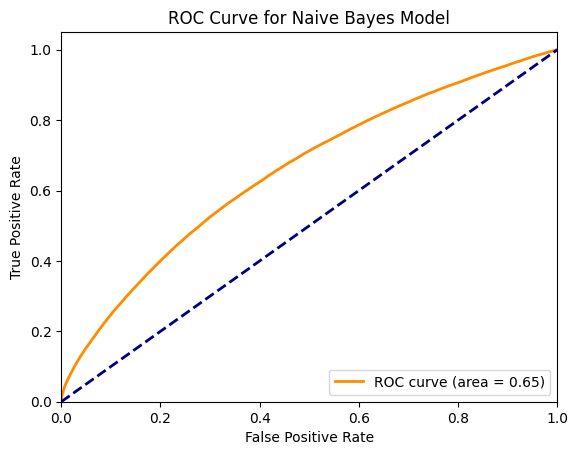

In [ ]:
# Extract the probabilities and labels
probabilities_nb = predictions_nb.select("probability").rdd.map(lambda x: x[0][1]).collect()
labels_nb = predictions_nb.select("label").rdd.map(lambda x: x[0]).collect()

# Compute ROC curve and ROC area
fpr_nb, tpr_nb, _ = roc_curve(labels_nb, probabilities_nb)
roc_auc_nb = auc(fpr_nb, tpr_nb)

# Plot
plt.figure()
plt.plot(fpr_nb, tpr_nb, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_nb)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Naive Bayes Model')
plt.legend(loc="lower right")
plt.show()

#### Random Forest

In [ ]:
# airline_indexer = StringIndexer(inputCol="AIRLINE", outputCol="AIRLINEIndex")

# origin_indexer = StringIndexer(inputCol="ORIGIN_AIRPORT", outputCol="ORIGIN_AIRPORTIndex")

# destination_indexer = StringIndexer(inputCol="DESTINATION_AIRPORT", outputCol="DESTINATION_AIRPORTIndex")

# assembler_tree = VectorAssembler(inputCols = ["MONTH", "DAY", "AIRLINEIndex", "FLIGHT_NUMBER", "ORIGIN_AIRPORTIndex",
#                                               "DESTINATION_AIRPORTIndex", "SCHEDULED_DEPARTURE", "DEPARTURE_DELAY",
#                                               "DISTANCE", "SCHEDULED_ARRIVAL", "DIVERTED", "CANCELLED"],
#                             outputCol='RAW_FEATURES')
# min_max_scaler = MinMaxScaler(inputCol="RAW_FEATURES", outputCol="FEATURES")

# pipeline_rf = Pipeline(stages=[
#     airline_indexer,
#     origin_indexer,
#     destination_indexer,
#     assembler_tree,
#     min_max_scaler
# ])
# # Fit the pipeline to your data
# pipeline_model_for_rf = pipeline_rf.fit(balanced_flights_delayed)

# # Transform your data
# transformed_flights_df_rf = pipeline_model_for_rf.transform(balanced_flights_delayed).select("FEATURES", "LABEL")
# training_data_rf, testing_data_rf = transformed_flights_df_rf.randomSplit([0.8, 0.2], seed=631)
# training_data_rf.cache()
# testing_data_rf.cache()

In [ ]:
from pyspark.ml.classification import RandomForestClassifier
# Create the trainer and set its parameters
rf = RandomForestClassifier(labelCol="LABEL", featuresCol="FEATURES", maxDepth = 10, numTrees = 10, maxBins = 32)

# Train the model
rf_model = rf.fit(training_data_indexer)

# Select example rows to display
predictions_rf = rf_model.transform(testing_data_indexer)
predictions_rf.show()

+--------------------+-----+--------------------+--------------------+----------+
|            FEATURES|LABEL|       rawPrediction|         probability|prediction|
+--------------------+-----+--------------------+--------------------+----------+
|[0.0,0.0,0.0,0.00...|    0|[7.80979431074544...|[0.78097943107454...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[9.13863424944278...|[0.91386342494427...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[8.81580190901474...|[0.88158019090147...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[8.99004099716312...|[0.89900409971631...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[9.12342293701015...|[0.91234229370101...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[7.75042753761611...|[0.77504275376161...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[8.43984162798361...|[0.84398416279836...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[7.66558441700659...|[0.76655844170065...|       0.0|
|[0.0,0.0,0.0,0.00...|    0|[8.81777402057657...|[0.88177740205765...|       0.0|
|[0.0,0.0,0.0,0.

##### Evaluation

In [ ]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator
# Compute accuracy on the test set
rf_evaluator = BinaryClassificationEvaluator(rawPredictionCol="prediction", labelCol="LABEL")
rf_accuracy = rf_evaluator.evaluate(predictions_rf)
print(f"Test Accuracy = {rf_accuracy}")

Test Accuracy = 0.8714023671221809


In [ ]:
confusion_matrix_rf = predictions_rf.groupBy('label').pivot('prediction', [0, 1]).count().na.fill(0).orderBy('label')
confusion_matrix_rf.show()

+-----+------+-----+
|label|     0|    1|
+-----+------+-----+
|    0|435137|28560|
|    1| 20803|85550|
+-----+------+-----+



In [ ]:
TN_rf = predictions_rf.filter('prediction = 0 AND label = 0').count()
TP_rf = predictions_rf.filter('prediction = 1 AND label = 1').count()
FN_rf = predictions_rf.filter('prediction = 0 AND label = 1').count()
FP_rf = predictions_rf.filter('prediction = 1 AND label = 0').count()

precision_rf = TP_rf / (TP_rf + FP_rf)
recall_rf = TP_rf / (TP_rf + FN_rf)

f_score_rf = (2 * precision_rf * recall_rf) / (precision_rf + recall_rf)

print(f"The precision of Random Forest is: {precision_rf}.")
print(f"The recall of Random Forest is: {recall_rf}.")

print(f"The F1-score of Random Forest is: {f_score_rf}.")

The precision of Random Forest is: 0.7497151871001665.
The recall of Random Forest is: 0.8043966789841377.
The F1-score of Random Forest is: 0.7760939477372621.


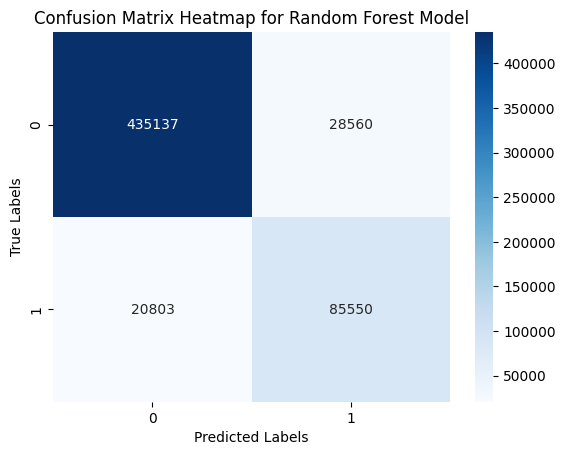

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

rf_cfm_data = confusion_matrix_rf.toPandas().drop(columns=['label']).values
# Create the heatmap
ax_dt = sns.heatmap(rf_cfm_data, annot=True, fmt='d', cmap='Blues')
ax_dt.set(xlabel='Predicted', ylabel='Actual');
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap for Random Forest Model')

plt.show()

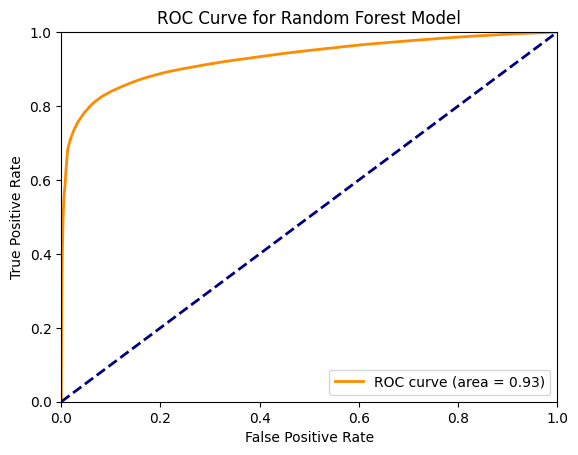

In [ ]:
from sklearn.metrics import roc_curve, auc
# Extract the probabilities and labels
probabilities_rf = predictions_rf.select("probability").rdd.map(lambda x: x[0][1]).collect()
labels_rf = predictions_rf.select("label").rdd.map(lambda x: x[0]).collect()

# Compute ROC curve and ROC area
fpr_rf, tpr_rf, _ = roc_curve(labels_rf, probabilities_rf)
roc_auc_rf = auc(fpr_rf, tpr_rf)

# Plot
plt.figure()
plt.plot(fpr_rf, tpr_rf, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_rf)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Random Forest Model')
plt.legend(loc="lower right")
plt.show()

### Compare the ROC curve of all 4 methods


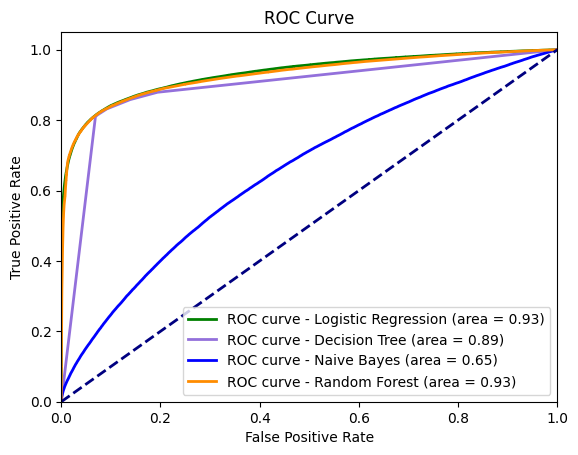

In [ ]:
# Plot
plt.figure()
plt.plot(fpr_lr, tpr_lr, color='green', lw=2, label='ROC curve - Logistic Regression (area = %0.2f)' % roc_auc_lr)
plt.plot(fpr_dt, tpr_dt, color='mediumpurple', lw=2, label='ROC curve - Decision Tree (area = %0.2f)' % roc_auc_dt)
plt.plot(fpr_nb, tpr_nb, color='blue', lw=2, label='ROC curve - Naive Bayes (area = %0.2f)' % roc_auc_nb)
plt.plot(fpr_rf, tpr_rf, color='darkorange', lw=2, label='ROC curve - Random Forest (area = %0.2f)' % roc_auc_rf)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()